Part (a) Image refactorization

In [23]:
import torch
import torch.optim as optim
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt

#img prep function
def prepare_image_masks_torchvision(img_path="example.jpg", missing_size=30, device=torch.device("cpu")):
    #load and normalize 
    img = torchvision.io.read_image(img_path).float() / 255.0  # [C,H,W]
    # img=transforms.Resize((128,128))(img)
    A=img.to(device)

    C,H,W=A.shape #taking in the dims

    #creating a square box of pixels missing image
    A_sq = A.clone()
    start_x,start_y=40,40   #start coords
    A_sq[:,start_x:start_x+missing_size,start_y:start_y+missing_size]=torch.nan #making it sparse

    #creating randomly removed pixel image
    A_rand=A.clone()
    num_missing=missing_size**2  #tot pixels
    for c in range(C):
        idx = torch.randperm(H*W)[:num_missing]  
        A_rand[c].view(-1)[idx]=torch.nan

    return A,A_sq,A_rand

#factorization with graduebt descent, on available values on all channels 
def stock_factorization_multichannel(og_matrix, rank):
    C,H,W = og_matrix.shape #taking in the dims
    reconstructed=torch.zeros_like(og_matrix)  #final reconstructed img

    Ws, Hs, losses, masks = [], [], [], []   #storing final Ws, Hs, losses and masks for all the three channels

    tolerance=1e-5
    max_iter=2000

    for c in range(C):
        W_matrix=torch.randn(H,rank,requires_grad=True)
        H_matrix=torch.randn(rank, W_matrix.shape[0],requires_grad=True)

        optimizer=optim.Adam([W_matrix,H_matrix],lr=0.01)
        mask=~torch.isnan(og_matrix[c])  #making the mask which helps us make the values which we dont know to zero while calculating

        for i in range(max_iter):
            diff_matrix = torch.mm(W_matrix, H_matrix) - og_matrix[c]
            diff_vector = diff_matrix[mask]
            loss=torch.norm(diff_vector)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            if loss<tolerance:
                    break
            if i%200==0:
                print(f"Channel {c}, Iter {i}, Loss: {loss.item()}")

        reconstructed[c]=torch.mm(W_matrix,H_matrix).detach()   #fin reconstruction
        Ws.append(W_matrix)
        Hs.append(H_matrix)
        losses.append(loss.item())
        masks.append(mask)

    return reconstructed, Ws, Hs, losses, masks


#function to compute RMSE and PSNR
def compute_rmse_psnr(original,reconstructed):

    mse=torch.mean((original-reconstructed)**2)

    rmse=torch.sqrt(mse).item()

    psnr=20*torch.log10(1.0/torch.sqrt(mse)).item()     #formula for psnr is 20*log10(max_val_poss/(rmse))
    return rmse,psnr

In [24]:
A.shape

torch.Size([3, 148, 148])

In [31]:
device = torch.device("cpu")

top, left = 40, 40
rank = 10  #low-rank value for factorization

#Load and prepare the images
A, A_rect, A_rand = prepare_image_masks_torchvision("D:\ML_course\cat.jpeg",missing_size=30,device=device)

#Factorize
recon_rect, Ws_r, Hs_r, losses_r, masks_r = stock_factorization_multichannel(A_rect, rank)
recon_rand, Ws_rand, Hs_rand, losses_rand, masks_rand = stock_factorization_multichannel(A_rand, rank)

#clamp vals to 1
recon_rect = torch.clamp(recon_rect, 0.0, 1.0)
recon_rand = torch.clamp(recon_rand, 0.0, 1.0)

#compute metrics prescribed before
rmse_rect, psnr_rect = compute_rmse_psnr(A, recon_rect)
rmse_rand, psnr_rand = compute_rmse_psnr(A, recon_rand)

<>:7: SyntaxWarning: invalid escape sequence '\M'
<>:7: SyntaxWarning: invalid escape sequence '\M'
C:\Users\Asus\AppData\Local\Temp\ipykernel_40748\868563206.py:7: SyntaxWarning: invalid escape sequence '\M'
  A, A_rect, A_rand = prepare_image_masks_torchvision("D:\ML_course\cat.jpeg",missing_size=30,device=device)


Channel 0, Iter 0, Loss: 486.4769287109375
Channel 0, Iter 200, Loss: 17.76850700378418
Channel 0, Iter 400, Loss: 12.310391426086426
Channel 0, Iter 600, Loss: 9.905893325805664
Channel 0, Iter 800, Loss: 8.807025909423828
Channel 0, Iter 1000, Loss: 8.05105209350586
Channel 0, Iter 1200, Loss: 7.368189811706543
Channel 0, Iter 1400, Loss: 6.707577228546143
Channel 0, Iter 1600, Loss: 6.165491580963135
Channel 0, Iter 1800, Loss: 5.775151252746582
Channel 1, Iter 0, Loss: 464.0345458984375
Channel 1, Iter 200, Loss: 14.446088790893555
Channel 1, Iter 400, Loss: 9.742478370666504
Channel 1, Iter 600, Loss: 8.937145233154297
Channel 1, Iter 800, Loss: 8.062482833862305
Channel 1, Iter 1000, Loss: 7.259117603302002
Channel 1, Iter 1200, Loss: 6.537712097167969
Channel 1, Iter 1400, Loss: 5.993793487548828
Channel 1, Iter 1600, Loss: 5.605796813964844
Channel 1, Iter 1800, Loss: 5.373496055603027
Channel 2, Iter 0, Loss: 478.6322326660156
Channel 2, Iter 200, Loss: 11.719827651977539
Chan

In [33]:
#printing them out
print(f"Square missing patch -> RMSE: {rmse_rect:.4f}, PSNR: {psnr_rect:.2f} dB")
print(f"Random missing patch     -> RMSE: {rmse_rand:.4f}, PSNR: {psnr_rand:.2f} dB")

Square missing patch -> RMSE: 0.0628, PSNR: 24.04 dB
Random missing patch     -> RMSE: 0.0397, PSNR: 28.03 dB


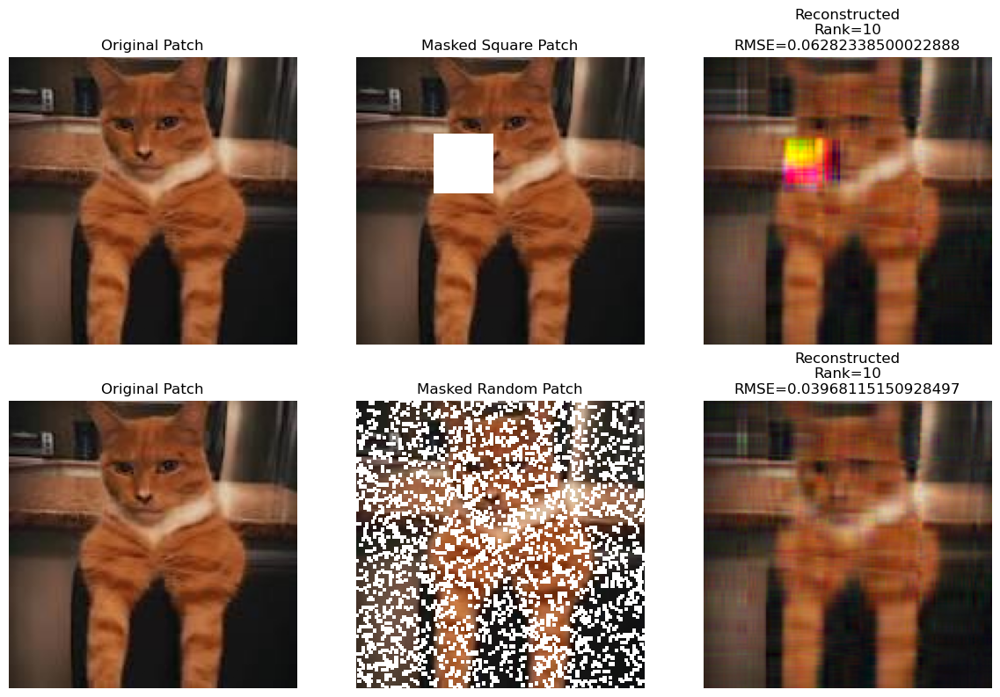

In [34]:
#visualizing
fig, axs = plt.subplots(2, 3, figsize=(12,8))

#Square box of pixels removal
axs[0,0].imshow(A.permute(1,2,0).cpu())
axs[0,0].set_title("Original Patch")
axs[0,1].imshow(A_rect.permute(1,2,0).cpu())
axs[0,1].set_title("Masked Square Patch")
axs[0,2].imshow(recon_rect.permute(1,2,0).cpu())
axs[0,2].set_title(f"Reconstructed\nRank={rank}\nRMSE={rmse_rect}")

#Randomly missing pixel values
axs[1,0].imshow(A.permute(1,2,0).cpu())
axs[1,0].set_title("Original Patch")
axs[1,1].imshow(A_rand.permute(1,2,0).cpu())
axs[1,1].set_title("Masked Random Patch")
axs[1,2].imshow(recon_rand.permute(1,2,0).cpu())
axs[1,2].set_title(f"Reconstructed\nRank={rank}\nRMSE={rmse_rand}")

for ax in axs.flatten():
    ax.axis("off")

plt.tight_layout()
plt.show()

An explanation to the noisy reconstruction in the case of a box-pixel removal
As we're removing a large chunk of the image, we cannot get a lot of information of the image in that region. As a result, during factorization, we don't have a lot of data that could support reconstruction of the original image, hence resulting in a very noisy reconstruction

Also, as we've chosen a rank of 15, the decrease in the number of elements to store is massive.
rank=15, so tot elements would be 2x148x15 (148 is the size of the img)
so, comparing to original (148x148), it is an ~80% decrease with the image still discernable

ALS Factorization

In [19]:
patch_rect.shape[1]

NameError: name 'patch_rect' is not defined

In [35]:
def stock_factorization_multichannel_ALS(og_matrix,rank):

    #from the rank make random matrices of n x r and r x n, n is the elements in the og_matrix
    C,H,W=og_matrix.shape
    reconstructed=torch.zeros_like(og_matrix)

    Ws,Hs,losses,masks=[],[],[],[]

    max_iter=2000
    tolerance=1e-5  #tolerance for min error to stop factorization


    # no_sig_change_counter=0

    for c in range(C):
        print("Currently, factorizing channel: ",c)
        W=torch.randn(og_matrix.shape[1],rank)
        H=torch.randn(rank,og_matrix.shape[2])

        mask=~torch.isnan(og_matrix[c])


        for it in range(max_iter):
            #updating W first
            for i in range(og_matrix[c].shape[0]):
                idx=mask[i, :]  #known entries in row i
                if idx.sum() == 0:
                    continue
                H_i=H[:, idx].T  #known ones
                og_matrix_i=og_matrix[c][i, idx]    
                W[i, :]=torch.linalg.lstsq(H_i,og_matrix_i).solution

            #NOw, updating H
            for j in range(og_matrix[c].shape[1]):
                idx=mask[:,j]  #known entries in col j
                if idx.sum() == 0:
                    continue
                W_j=W[idx,:]  #known ones
                og_matrix_j=og_matrix[c][idx, j]    
                H[:,j]=torch.linalg.lstsq(W_j, og_matrix_j).solution

            #computing loss to monitor the convergence

            with torch.no_grad():
                pred = W @ H
                diff = (pred - og_matrix[c])[mask]
                loss = torch.norm(diff)

                if loss<tolerance:  #break condition
                    break

                if it % 100 == 0:
                    print(f"Iter {it}: Loss = {loss.item()}")
                    
            
        reconstructed[c]=torch.mm(W,H).detach()
        Ws.append(W)
        Hs.append(H)
        losses.append(loss.item())
        masks.append(mask)

    return reconstructed, Ws, Hs, losses, masks

Currently, factorizing channel:  0
Iter 0: Loss = 9.430753707885742
Iter 100: Loss = 4.582956314086914
Iter 200: Loss = 4.5825114250183105
Iter 300: Loss = 4.582362651824951
Iter 400: Loss = 4.582303524017334
Iter 500: Loss = 4.582275867462158
Iter 600: Loss = 4.5822625160217285
Iter 700: Loss = 4.582254409790039
Iter 800: Loss = 4.582251071929932
Iter 900: Loss = 4.582249641418457
Iter 1000: Loss = 4.582249164581299
Iter 1100: Loss = 4.582248210906982
Iter 1200: Loss = 4.582247734069824
Iter 1300: Loss = 4.582247257232666
Iter 1400: Loss = 4.582247734069824
Iter 1500: Loss = 4.582248210906982
Iter 1600: Loss = 4.582247257232666
Iter 1700: Loss = 4.582247257232666
Iter 1800: Loss = 4.582247734069824
Iter 1900: Loss = 4.582247257232666
Currently, factorizing channel:  1
Iter 0: Loss = 8.950908660888672
Iter 100: Loss = 4.3517632484436035
Iter 200: Loss = 4.348430156707764
Iter 300: Loss = 4.347437381744385
Iter 400: Loss = 4.346918106079102
Iter 500: Loss = 4.346593856811523
Iter 600: L

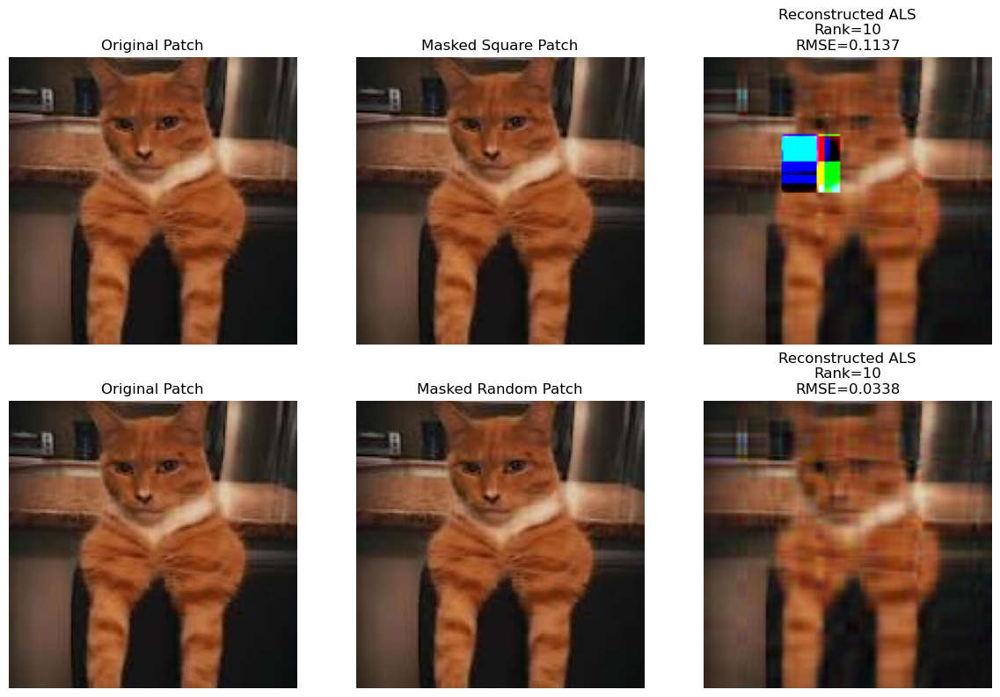

In [37]:
#Factorization using ALS
recon_rect_ALS, Ws_r_ALS, Hs_r_ALS, losses_r_ALS, masks_r_ALS =stock_factorization_multichannel_ALS(A_rect, 10)
recon_rand_ALS, Ws_rand_ALS, Hs_rand_ALS, losses_rand_ALS, masks_rand_ALS =stock_factorization_multichannel_ALS(A_rand, 10)

#clamping the vals to 1 , because normalized
recon_rect_ALS = torch.clamp(recon_rect_ALS, 0.0, 1.0)
recon_rand_ALS = torch.clamp(recon_rand_ALS, 0.0, 1.0)

#compute metrics
rmse_rect_ALS, psnr_rect_ALS=compute_rmse_psnr(A, recon_rect_ALS)
rmse_rand_ALS, psnr_rand_ALS=compute_rmse_psnr(A, recon_rand_ALS)

print(f"Square missing patch (ALS)  RMSE: {rmse_rect_ALS}, PSNR: {psnr_rect_ALS} dB")
print(f"Random missing patch (ALS)       RMSE: {rmse_rand_ALS}, PSNR: {psnr_rand_ALS} dB")

# Step 5: Visualization
fig, axs = plt.subplots(2, 3, figsize=(12,8))

#sqaure missing block of pixels
axs[0,0].imshow(A.permute(1,2,0).cpu())
axs[0,0].set_title("Original Patch")
axs[0,1].imshow(A.permute(1,2,0).cpu())
axs[0,1].set_title("Masked Square Patch")
axs[0,2].imshow(recon_rect_ALS.permute(1,2,0).cpu())
axs[0,2].set_title(f"Reconstructed ALS\nRank={10}\nRMSE={rmse_rect_ALS:.4f}")

#Random missing pixels
axs[1,0].imshow(A.permute(1,2,0).cpu())
axs[1,0].set_title("Original Patch")
axs[1,1].imshow(A.permute(1,2,0).cpu())
axs[1,1].set_title("Masked Random Patch")
axs[1,2].imshow(recon_rand_ALS.permute(1,2,0).cpu())
axs[1,2].set_title(f"Reconstructed ALS\nRank={10}\nRMSE={rmse_rand_ALS:.4f}")

for ax in axs.flatten():
    ax.axis("off")

plt.tight_layout()
plt.show()


TOO many iterations, about 5000 resulted in pretty noisy images, keeping the max iterations to about a 1000-2000 resulted in good reconstruction in both cases

BUT ALS does take a lot of time


In [39]:
#printing them out
print(f"Square missing patch (ALS)  RMSE: {rmse_rect_ALS}, PSNR: {psnr_rect_ALS} dB")
print(f"Random missing patch (ALS)       RMSE: {rmse_rand_ALS}, PSNR: {psnr_rand_ALS} dB")

Square missing patch (ALS)  RMSE: 0.11367333680391312, PSNR: 18.88682723045349 dB
Random missing patch (ALS)       RMSE: 0.03383157029747963, PSNR: 29.413557052612305 dB


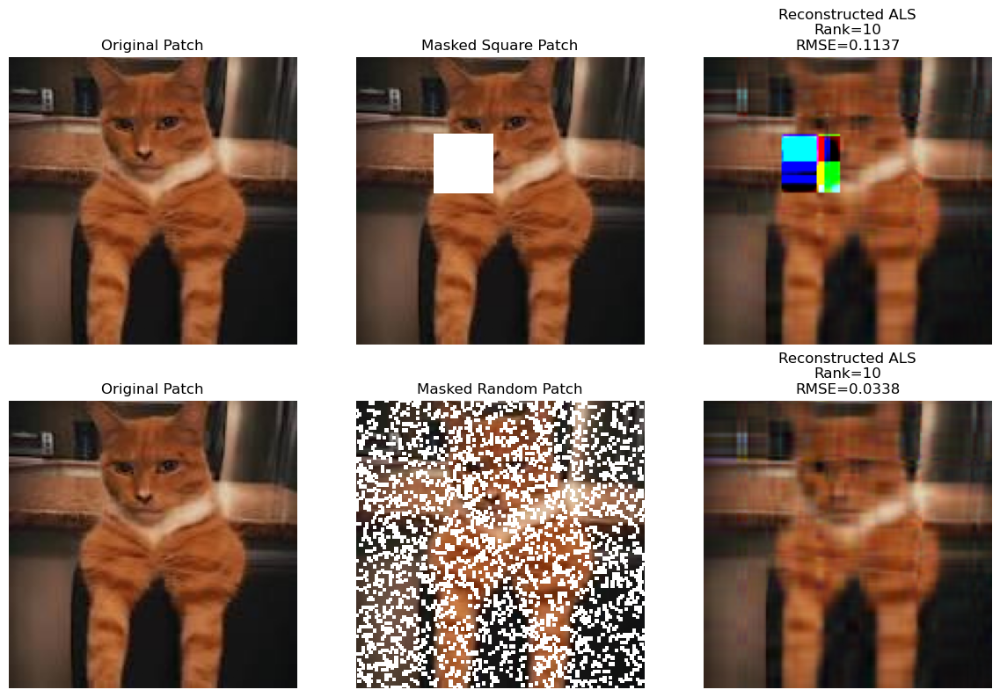

In [40]:
#visualizing
fig, axs = plt.subplots(2, 3, figsize=(12,8))

#Square box of pixels removal
axs[0,0].imshow(A.permute(1,2,0).cpu())
axs[0,0].set_title("Original Patch")
axs[0,1].imshow(A_rect.permute(1,2,0).cpu())
axs[0,1].set_title("Masked Square Patch")
axs[0,2].imshow(recon_rect_ALS.permute(1,2,0).cpu())
axs[0,2].set_title(f"Reconstructed ALS\nRank={rank}\nRMSE={rmse_rect_ALS:.4f}")

# Row 2: Random missing pixels
axs[1,0].imshow(A.permute(1,2,0).cpu())
axs[1,0].set_title("Original Patch")
axs[1,1].imshow(A_rand.permute(1,2,0).cpu())
axs[1,1].set_title("Masked Random Patch")
axs[1,2].imshow(recon_rand_ALS.permute(1,2,0).cpu())
axs[1,2].set_title(f"Reconstructed ALS\nRank={rank}\nRMSE={rmse_rand_ALS:.4f}")

for ax in axs.flatten():
    ax.axis("off")

plt.tight_layout()
plt.show()

Observations:
The reproduction of the picture with a block of pixels removed is much worse than the one with random pixels removed across the image

Part (b) Data compression

In [69]:
crop_size=50

In [70]:
B,B_rect, B_rand = prepare_image_masks_torchvision("D:\ML_course\cat_test.jpeg", missing_size=30, device=device)

<>:1: SyntaxWarning: invalid escape sequence '\M'
<>:1: SyntaxWarning: invalid escape sequence '\M'
C:\Users\Asus\AppData\Local\Temp\ipykernel_40748\1657657304.py:1: SyntaxWarning: invalid escape sequence '\M'
  B,B_rect, B_rand = prepare_image_masks_torchvision("D:\ML_course\cat_test.jpeg", missing_size=30, device=device)


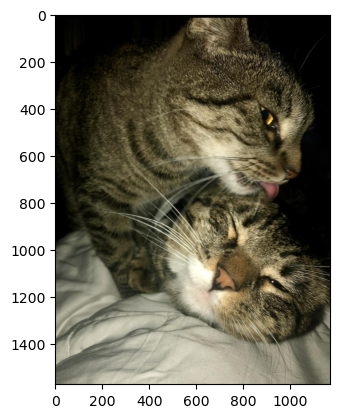

In [71]:
#Lets select the image patches
plt.imshow(B.permute(1,2,0).cpu())

In [72]:
B.shape

torch.Size([3, 1572, 1170])

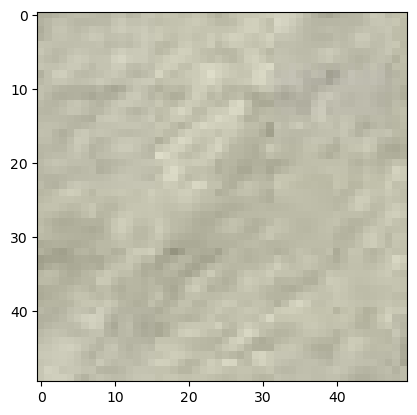

In [73]:
#Selecting patches with only one color, two colors and more than one color?
#ONLY ONE COLOR
dc_crop_size=50
patch_one_color = B[:, 1400:1400+crop_size, 400:400+crop_size]
plt.imshow(patch_one_color.permute(1,2,0).cpu())


 Running Factorization with Rank = 5 
Channel 0, Iter 0, Loss: 112.12938690185547
Channel 0, Iter 200, Loss: 1.6383846998214722
Channel 0, Iter 400, Loss: 1.4701541662216187
Channel 0, Iter 600, Loss: 1.4290382862091064
Channel 0, Iter 800, Loss: 1.4095487594604492
Channel 0, Iter 1000, Loss: 1.3868249654769897
Channel 0, Iter 1200, Loss: 1.3587055206298828
Channel 0, Iter 1400, Loss: 1.328089714050293
Channel 0, Iter 1600, Loss: 1.2999303340911865
Channel 0, Iter 1800, Loss: 1.2761415243148804
Channel 1, Iter 0, Loss: 128.89950561523438
Channel 1, Iter 200, Loss: 1.637192726135254
Channel 1, Iter 400, Loss: 1.5774471759796143
Channel 1, Iter 600, Loss: 1.5272533893585205
Channel 1, Iter 800, Loss: 1.4662104845046997
Channel 1, Iter 1000, Loss: 1.4035676717758179
Channel 1, Iter 1200, Loss: 1.349414587020874
Channel 1, Iter 1400, Loss: 1.3057011365890503
Channel 1, Iter 1600, Loss: 1.27371346950531
Channel 1, Iter 1800, Loss: 1.2493400573730469
Channel 2, Iter 0, Loss: 125.04959106445

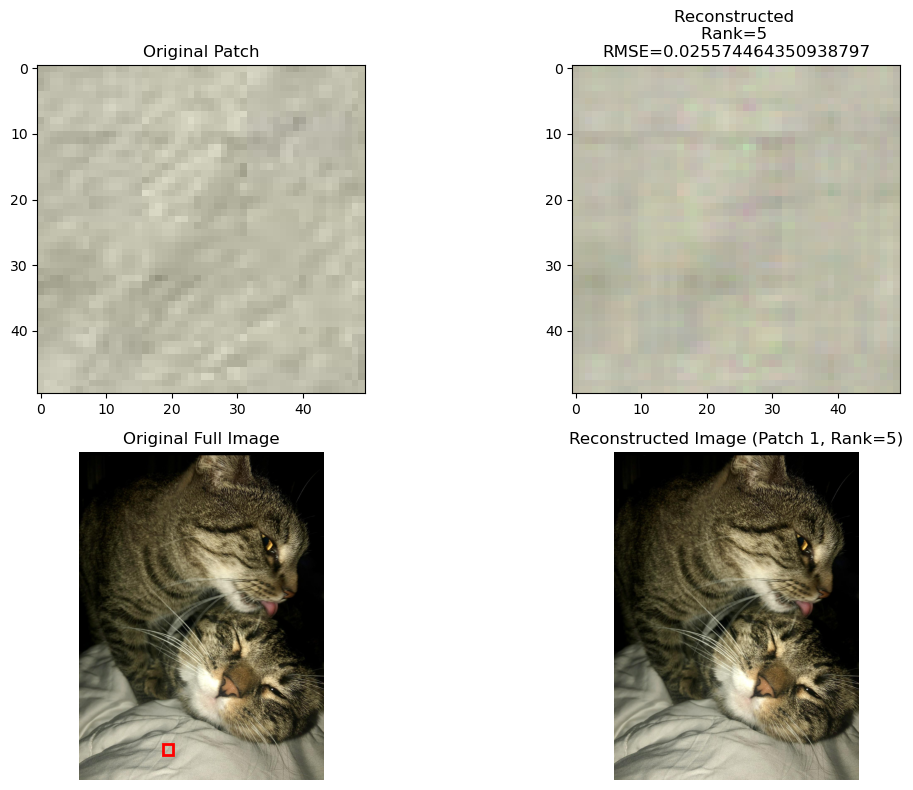


 Running Factorization with Rank = 10 
Channel 0, Iter 0, Loss: 143.8252410888672
Channel 0, Iter 200, Loss: 1.5282220840454102
Channel 0, Iter 400, Loss: 1.3946046829223633
Channel 0, Iter 600, Loss: 1.2113006114959717
Channel 0, Iter 800, Loss: 1.1360316276550293
Channel 0, Iter 1000, Loss: 1.0813615322113037
Channel 0, Iter 1200, Loss: 1.0450482368469238
Channel 0, Iter 1400, Loss: 1.0144212245941162
Channel 0, Iter 1600, Loss: 0.9896886348724365
Channel 0, Iter 1800, Loss: 0.9723904132843018
Channel 1, Iter 0, Loss: 158.74732971191406
Channel 1, Iter 200, Loss: 1.5371513366699219
Channel 1, Iter 400, Loss: 1.43942129611969
Channel 1, Iter 600, Loss: 1.3182156085968018
Channel 1, Iter 800, Loss: 1.2152585983276367
Channel 1, Iter 1000, Loss: 1.1405959129333496
Channel 1, Iter 1200, Loss: 1.1056877374649048
Channel 1, Iter 1400, Loss: 1.0994375944137573
Channel 1, Iter 1600, Loss: 1.0611732006072998
Channel 1, Iter 1800, Loss: 1.0492939949035645
Channel 2, Iter 0, Loss: 163.94931030

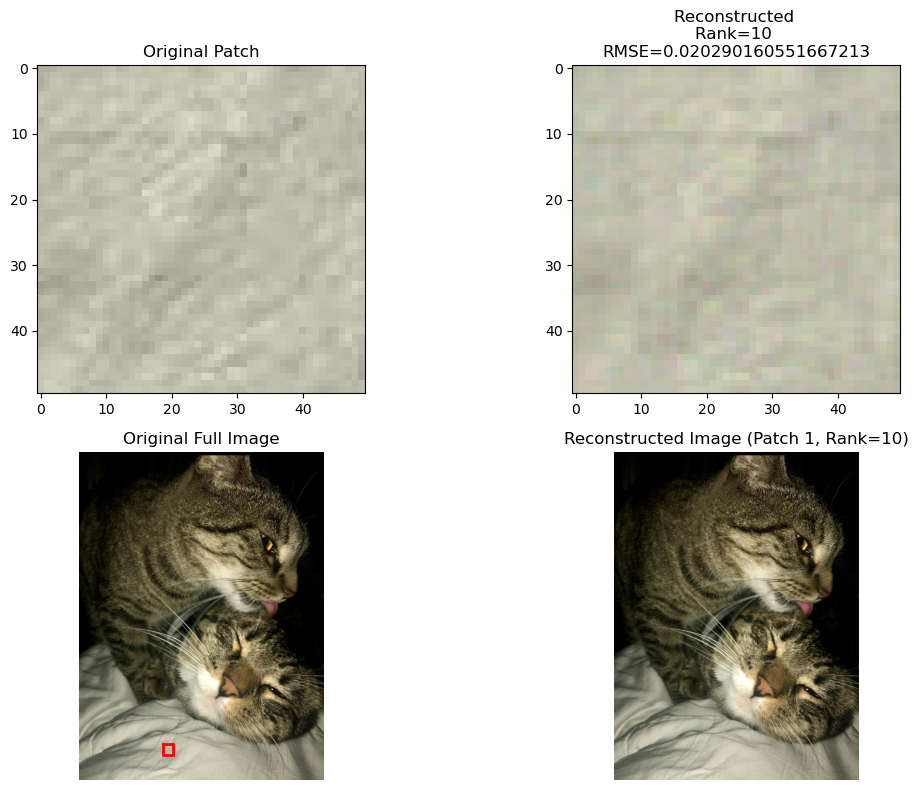


 Running Factorization with Rank = 25 
Channel 0, Iter 0, Loss: 248.04998779296875
Channel 0, Iter 200, Loss: 1.1370275020599365
Channel 0, Iter 400, Loss: 0.9936094880104065
Channel 0, Iter 600, Loss: 0.9353912472724915
Channel 0, Iter 800, Loss: 0.8700604438781738
Channel 0, Iter 1000, Loss: 0.8392428755760193
Channel 0, Iter 1200, Loss: 0.7975350022315979
Channel 0, Iter 1400, Loss: 0.7792399525642395
Channel 0, Iter 1600, Loss: 0.746256411075592
Channel 0, Iter 1800, Loss: 0.7219367623329163
Channel 1, Iter 0, Loss: 252.7995147705078
Channel 1, Iter 200, Loss: 1.1740942001342773
Channel 1, Iter 400, Loss: 0.9825080633163452
Channel 1, Iter 600, Loss: 0.906032383441925
Channel 1, Iter 800, Loss: 0.8490240573883057
Channel 1, Iter 1000, Loss: 0.7883086204528809
Channel 1, Iter 1200, Loss: 0.7549569010734558
Channel 1, Iter 1400, Loss: 0.7278721928596497
Channel 1, Iter 1600, Loss: 0.7012655735015869
Channel 1, Iter 1800, Loss: 0.6760944128036499
Channel 2, Iter 0, Loss: 257.89157104

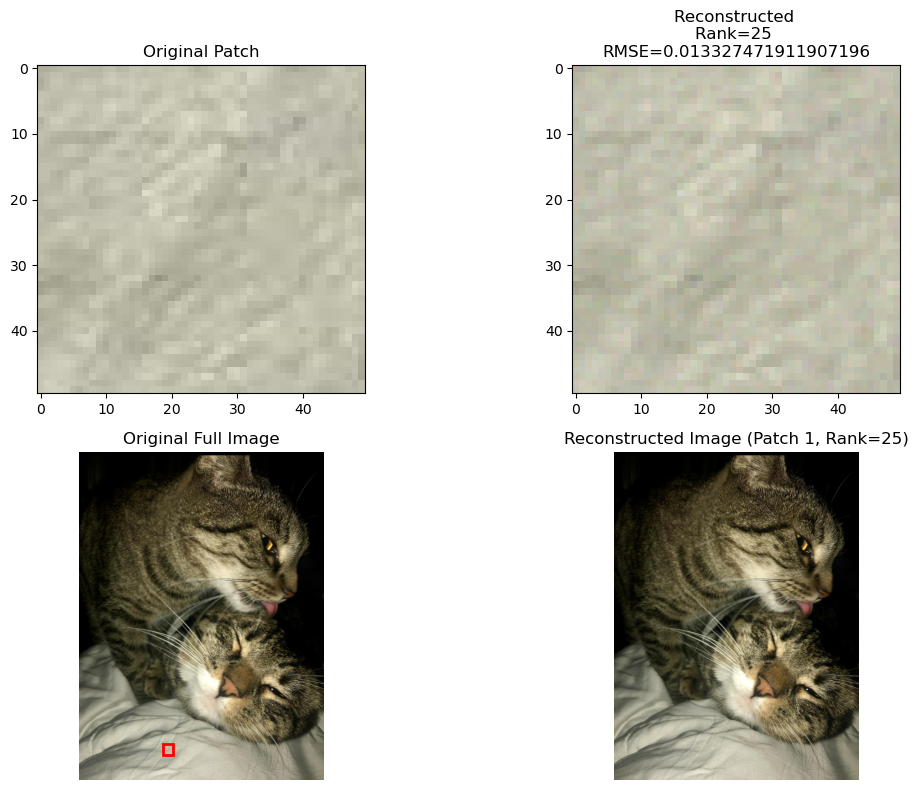


 Running Factorization with Rank = 50 
Channel 0, Iter 0, Loss: 374.0907897949219
Channel 0, Iter 200, Loss: 0.7759901881217957
Channel 0, Iter 400, Loss: 0.6508657932281494
Channel 0, Iter 600, Loss: 0.5927121043205261
Channel 0, Iter 800, Loss: 0.5582014322280884
Channel 0, Iter 1000, Loss: 0.5376247763633728
Channel 0, Iter 1200, Loss: 0.5178359746932983
Channel 0, Iter 1400, Loss: 0.5036489963531494
Channel 0, Iter 1600, Loss: 0.4896519184112549
Channel 0, Iter 1800, Loss: 0.4782268702983856
Channel 1, Iter 0, Loss: 367.83294677734375
Channel 1, Iter 200, Loss: 0.8248144388198853
Channel 1, Iter 400, Loss: 0.6635266542434692
Channel 1, Iter 600, Loss: 0.6087278723716736
Channel 1, Iter 800, Loss: 0.5721585750579834
Channel 1, Iter 1000, Loss: 0.5570284128189087
Channel 1, Iter 1200, Loss: 0.5359025597572327
Channel 1, Iter 1400, Loss: 0.5201560854911804
Channel 1, Iter 1600, Loss: 0.5043842792510986
Channel 1, Iter 1800, Loss: 0.4903319776058197
Channel 2, Iter 0, Loss: 368.352569

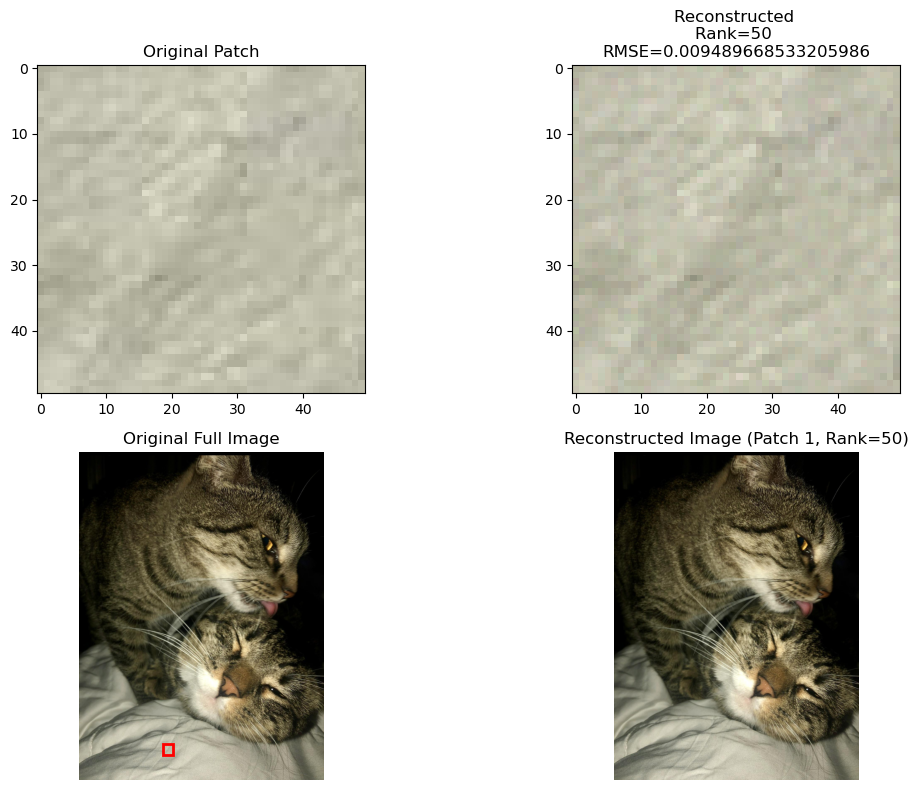

In [74]:
#for different ranks
r=[5,10,25,50]

#storing them
results_patch_1=[]

for rank in r:
    print(f"\n Running Factorization with Rank = {rank} ")

    #Stock Factorization
    recon_patch_1, Ws_patch_1, Hs_patch_1, losses_patch_1, masks_patch_1 = stock_factorization_multichannel(patch_one_color, rank)

    #clamp reconstructed vals to 1
    recon_patch_1=torch.clamp(recon_patch_1, 0.0, 1.0)
        
    #compute metrics prescribed before
    rmse_patch_1, psnr_patch_1=compute_rmse_psnr(patch_one_color, recon_patch_1)

    #store results
    results_patch_1.append((rank, rmse_patch_1, psnr_patch_1))

    print(f"Patch 1 , r={rank} -> RMSE: {rmse_patch_1:.4f}, PSNR: {psnr_patch_1:.2f} dB")

    #visualizing them
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_one_color.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_1.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed \nRank={rank} \nRMSE={rmse_patch_1}")

    top_1, left_1 = 1400,400   #from rhe previous cell

    patch_size_1 = patch_one_color.shape[1]  

    #clone the image and then replace the og patch with the reconstructed patch
    img_reconstructed_full_1=B.clone()

    # Replace the patch region with the reconstructed one
    img_reconstructed_full_1[:, top_1:top_1+patch_size_1, left_1:left_1+patch_size_1] = recon_patch_1

    #adding red rectangle around patch
    rect = plt.Rectangle(
        (left_1, top_1), patch_size_1, patch_size_1,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect)

    axs[1][0].imshow(B.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_1.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 1, Rank={rank})")
    axs[1][1].axis("off")

    plt.tight_layout()
    plt.show()



In [75]:
#summarizing them in a table
import pandas as pd

data_patch_1= pd.DataFrame(columns=["Rank","RMSE_patch_1","PSNR_patch_1"])
for i in range(len(r)):
    data_patch_1.loc[len(data_patch_1)]=[r[i],results_patch_1[i][1],results_patch_1[i][2]]


In [76]:
data_patch_1

,Rank,RMSE_patch_1,PSNR_patch_1
0,5.0,0.025574,31.843870
1,10.0,0.020290,33.854291
2,25.0,0.013327,37.505045
3,50.0,0.009490,40.454979


We can see the drop in RMSE and increaese in PSNR

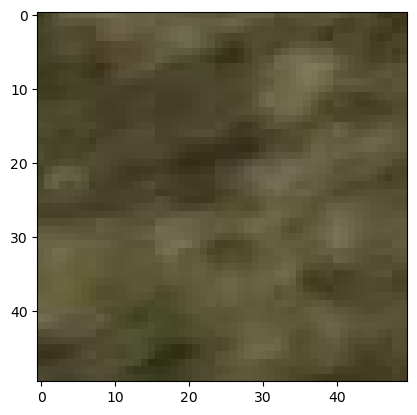

In [77]:
#Two-three colors
patch_tw_th_color = B[:, 600:600+crop_size, 200:200+crop_size]
plt.imshow(patch_tw_th_color.permute(1,2,0).cpu())


   Running Factorization with Rank = 5 
Channel 0, Iter 0, Loss: 108.44367218017578
Channel 0, Iter 200, Loss: 3.2739524841308594
Channel 0, Iter 400, Loss: 1.8076956272125244
Channel 0, Iter 600, Loss: 1.6134694814682007
Channel 0, Iter 800, Loss: 1.4709819555282593
Channel 0, Iter 1000, Loss: 1.3567585945129395
Channel 0, Iter 1200, Loss: 1.268462061882019
Channel 0, Iter 1400, Loss: 1.209227442741394
Channel 0, Iter 1600, Loss: 1.1670300960540771
Channel 0, Iter 1800, Loss: 1.1342389583587646
Channel 1, Iter 0, Loss: 119.40992736816406
Channel 1, Iter 200, Loss: 2.0723838806152344
Channel 1, Iter 400, Loss: 1.9805071353912354
Channel 1, Iter 600, Loss: 1.8493561744689941
Channel 1, Iter 800, Loss: 1.6961863040924072
Channel 1, Iter 1000, Loss: 1.552901029586792
Channel 1, Iter 1200, Loss: 1.4388262033462524
Channel 1, Iter 1400, Loss: 1.3642538785934448
Channel 1, Iter 1600, Loss: 1.3110500574111938
Channel 1, Iter 1800, Loss: 1.2728148698806763
Channel 2, Iter 0, Loss: 114.6533508

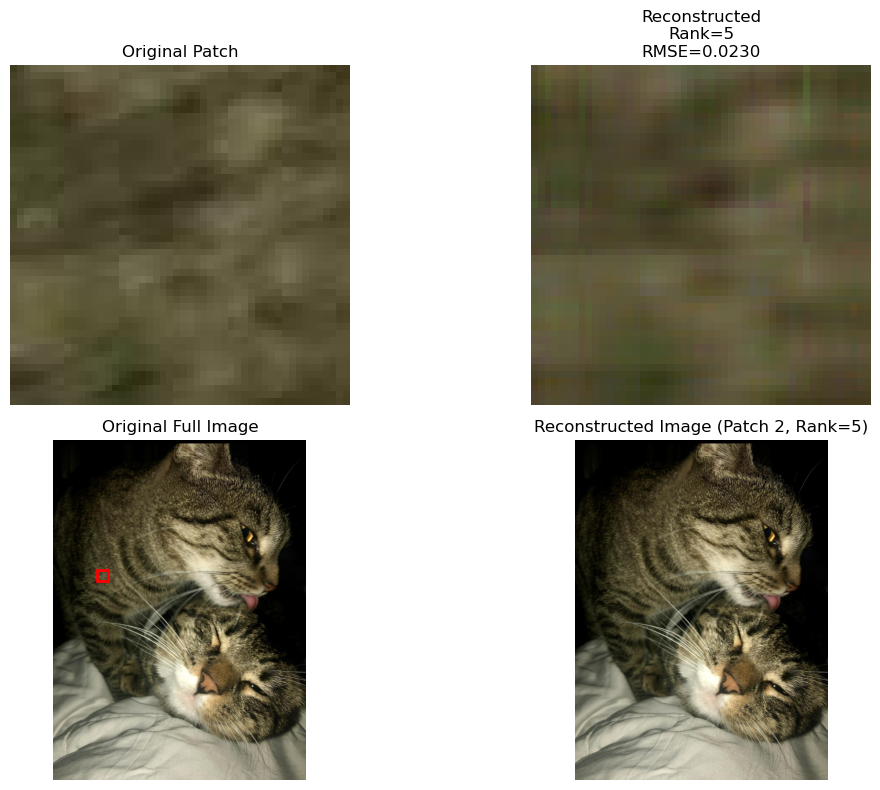


   Running Factorization with Rank = 10 
Channel 0, Iter 0, Loss: 159.82070922851562
Channel 0, Iter 200, Loss: 1.934198260307312
Channel 0, Iter 400, Loss: 1.345215082168579
Channel 0, Iter 600, Loss: 1.170780897140503
Channel 0, Iter 800, Loss: 1.0454427003860474
Channel 0, Iter 1000, Loss: 0.9519668221473694
Channel 0, Iter 1200, Loss: 0.9015530943870544
Channel 0, Iter 1400, Loss: 0.8488231897354126
Channel 0, Iter 1600, Loss: 0.8146151900291443
Channel 0, Iter 1800, Loss: 0.796571671962738
Channel 1, Iter 0, Loss: 154.48292541503906
Channel 1, Iter 200, Loss: 1.8794231414794922
Channel 1, Iter 400, Loss: 1.44895339012146
Channel 1, Iter 600, Loss: 1.1555185317993164
Channel 1, Iter 800, Loss: 1.0063577890396118
Channel 1, Iter 1000, Loss: 0.9026855230331421
Channel 1, Iter 1200, Loss: 0.8350454568862915
Channel 1, Iter 1400, Loss: 0.7799289226531982
Channel 1, Iter 1600, Loss: 0.7444109320640564
Channel 1, Iter 1800, Loss: 0.7184035778045654
Channel 2, Iter 0, Loss: 156.605117797

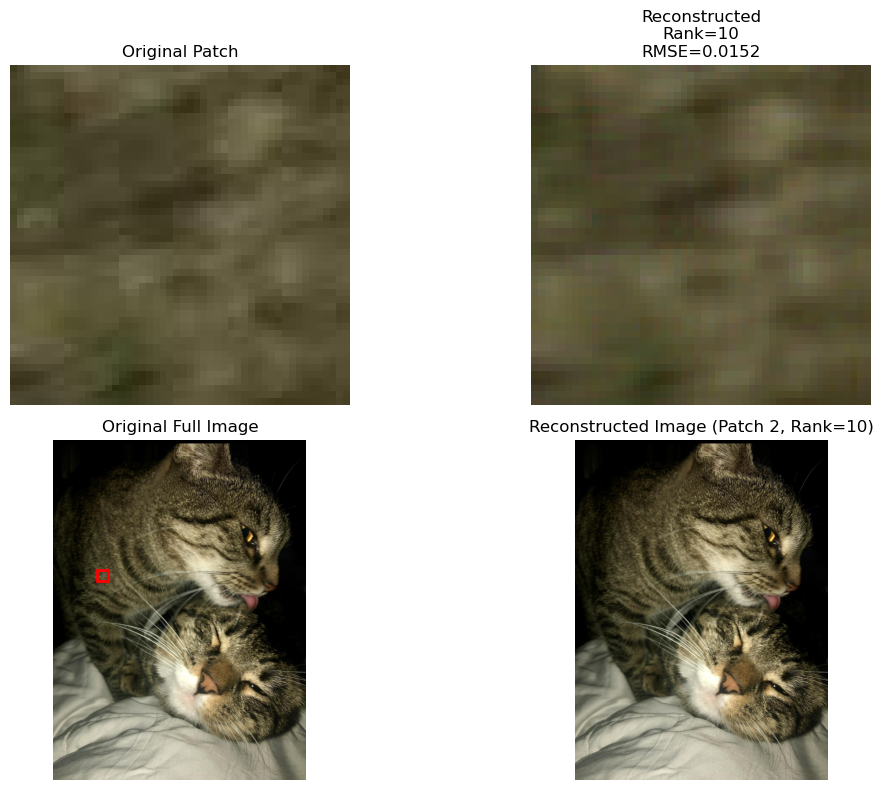


   Running Factorization with Rank = 25 
Channel 0, Iter 0, Loss: 242.4779510498047
Channel 0, Iter 200, Loss: 1.0158754587173462
Channel 0, Iter 400, Loss: 0.7971622347831726
Channel 0, Iter 600, Loss: 0.7141396403312683
Channel 0, Iter 800, Loss: 0.6821975708007812
Channel 0, Iter 1000, Loss: 0.6427768468856812
Channel 0, Iter 1200, Loss: 0.6110044121742249
Channel 0, Iter 1400, Loss: 0.5821627974510193
Channel 0, Iter 1600, Loss: 0.5490177869796753
Channel 0, Iter 1800, Loss: 0.528328537940979
Channel 1, Iter 0, Loss: 255.76345825195312
Channel 1, Iter 200, Loss: 1.4300957918167114
Channel 1, Iter 400, Loss: 0.8091609477996826
Channel 1, Iter 600, Loss: 0.7036093473434448
Channel 1, Iter 800, Loss: 0.6392548084259033
Channel 1, Iter 1000, Loss: 0.6074077486991882
Channel 1, Iter 1200, Loss: 0.5734422206878662
Channel 1, Iter 1400, Loss: 0.5543396472930908
Channel 1, Iter 1600, Loss: 0.5318666100502014
Channel 1, Iter 1800, Loss: 0.5185529589653015
Channel 2, Iter 0, Loss: 230.20962

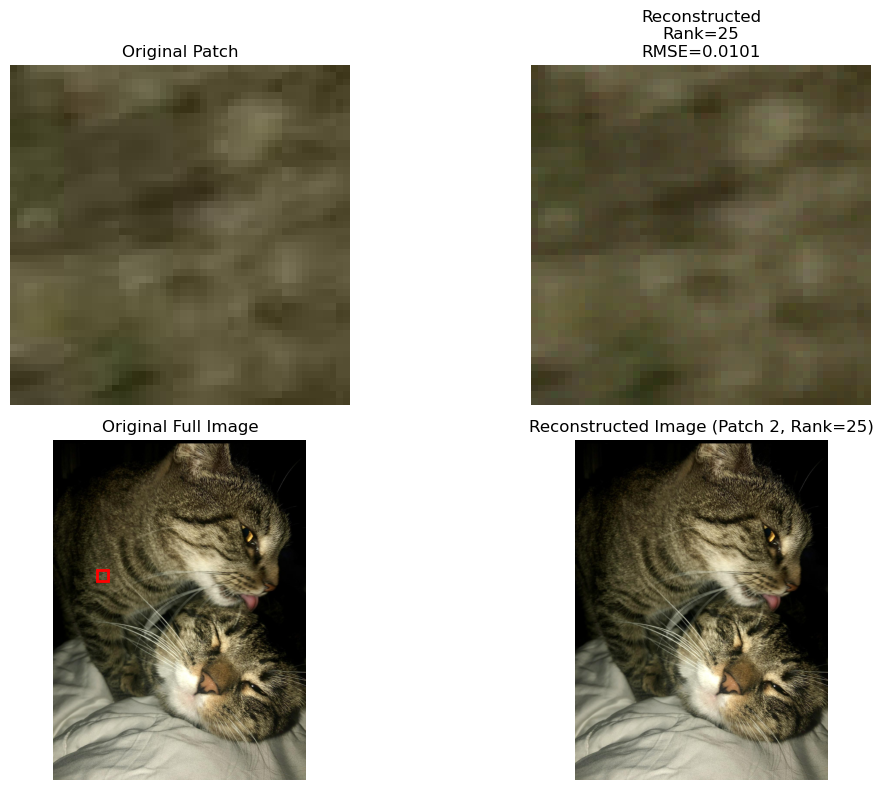


   Running Factorization with Rank = 50 
Channel 0, Iter 0, Loss: 355.92987060546875
Channel 0, Iter 200, Loss: 0.7589206099510193
Channel 0, Iter 400, Loss: 0.5911116003990173
Channel 0, Iter 600, Loss: 0.5265453457832336
Channel 0, Iter 800, Loss: 0.4914255440235138
Channel 0, Iter 1000, Loss: 0.46896079182624817
Channel 0, Iter 1200, Loss: 0.4526022970676422
Channel 0, Iter 1400, Loss: 0.4387580156326294
Channel 0, Iter 1600, Loss: 0.4288100004196167
Channel 0, Iter 1800, Loss: 0.4168415665626526
Channel 1, Iter 0, Loss: 357.1932373046875
Channel 1, Iter 200, Loss: 0.8198630213737488
Channel 1, Iter 400, Loss: 0.6066756248474121
Channel 1, Iter 600, Loss: 0.5318419933319092
Channel 1, Iter 800, Loss: 0.49986907839775085
Channel 1, Iter 1000, Loss: 0.47120973467826843
Channel 1, Iter 1200, Loss: 0.46268394589424133
Channel 1, Iter 1400, Loss: 0.4467232823371887
Channel 1, Iter 1600, Loss: 0.43104663491249084
Channel 1, Iter 1800, Loss: 0.42078760266304016
Channel 2, Iter 0, Loss: 35

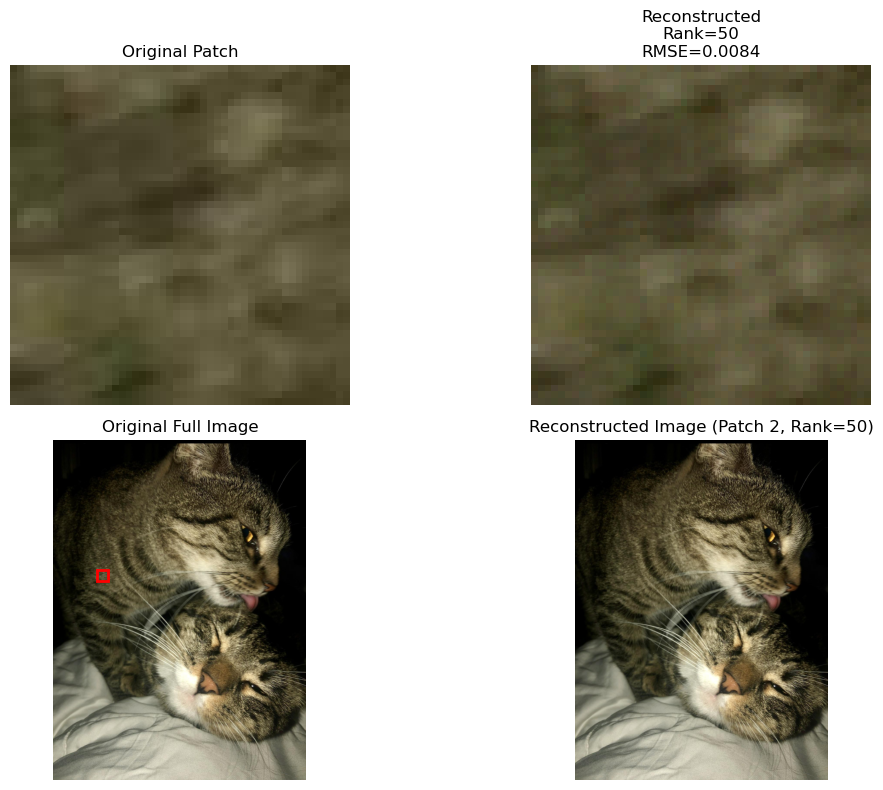

In [78]:
#for different ranks
r=[5,10,25,50]

#for storing them
results_patch_2=[]

for rank in r:
    print(f"\n   Running Factorization with Rank = {rank} ")

    #Factorization
    recon_patch_2, Ws_patch_2, Hs_patch_2, losses_patch_2, masks_patch_2 = stock_factorization_multichannel(patch_tw_th_color, rank)

    #clamping the reconstructed values to 1 as while reconstrucing doesn't care about the pixel normalized limits
    recon_patch_2 = torch.clamp(recon_patch_2, 0.0, 1.0)
        
    #compute the metrics
    rmse_patch_2, psnr_patch_2 = compute_rmse_psnr(patch_tw_th_color, recon_patch_2)

    #store and print the reslts and metrics
    results_patch_2.append((rank, rmse_patch_2, psnr_patch_2))

    print(f"Patch 2 , r={rank} -> RMSE: {rmse_patch_2:.4f}, PSNR: {psnr_patch_2:.2f} dB")

    #Visualizing
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_tw_th_color.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_2.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed\nRank={rank}\nRMSE={rmse_patch_2:.4f}")

    top_2, left_2 = 600, 200

    patch_size_2 = patch_tw_th_color.shape[1]  

    #cloning original image
    img_reconstructed_full_2 = B.clone()

    #replace the og patch with our reconstructed patch
    img_reconstructed_full_2[:, top_2:top_2+patch_size_2, left_2:left_2+patch_size_2] = recon_patch_2
    
    # add red rectangle around patch
    rect = plt.Rectangle(
        (left_2, top_2), patch_size_2, patch_size_2,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect)


    axs[1][0].imshow(B.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_2.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 2, Rank={rank})")
    axs[1][1].axis("off")

    for ax in axs.flatten():
        ax.axis("off")

    plt.tight_layout()
    plt.show()


In [79]:
#summarizing as a table
data_patch_2= pd.DataFrame(columns=["Rank","RMSE_patch_2","PSNR_patch_2"])
for i in range(len(r)):
    data_patch_2.loc[len(data_patch_2)]=[r[i],results_patch_2[i][1],results_patch_2[i][2]]

In [80]:
data_patch_2

,Rank,RMSE_patch_2,PSNR_patch_2
0,5.0,0.022992,32.768357
1,10.0,0.015181,36.374152
2,25.0,0.010111,39.904120
3,50.0,0.008366,41.549478


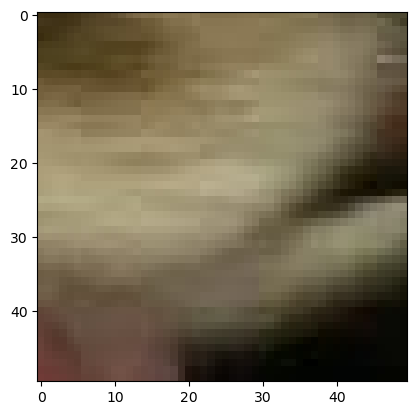

In [81]:
#4-5 colors
patch_4_5_color = B[:, 680:680+crop_size, 930:930+crop_size]
plt.imshow(patch_4_5_color.permute(1,2,0).cpu())


   Running Factorization with Rank = 5   
Channel 0, Iter 0, Loss: 108.158447265625
Channel 0, Iter 200, Loss: 3.4175424575805664
Channel 0, Iter 400, Loss: 2.1899757385253906
Channel 0, Iter 600, Loss: 1.6255866289138794
Channel 0, Iter 800, Loss: 1.2898228168487549
Channel 0, Iter 1000, Loss: 1.1185855865478516
Channel 0, Iter 1200, Loss: 1.05266535282135
Channel 0, Iter 1400, Loss: 1.0250273942947388
Channel 0, Iter 1600, Loss: 1.0001510381698608
Channel 0, Iter 1800, Loss: 0.972794771194458
Channel 1, Iter 0, Loss: 118.32034301757812
Channel 1, Iter 200, Loss: 4.646984577178955
Channel 1, Iter 400, Loss: 2.9428083896636963
Channel 1, Iter 600, Loss: 1.8620343208312988
Channel 1, Iter 800, Loss: 1.4272005558013916
Channel 1, Iter 1000, Loss: 1.1619021892547607
Channel 1, Iter 1200, Loss: 1.0595109462738037
Channel 1, Iter 1400, Loss: 1.0306658744812012
Channel 1, Iter 1600, Loss: 1.011255145072937
Channel 1, Iter 1800, Loss: 0.9869961142539978
Channel 2, Iter 0, Loss: 111.035278320

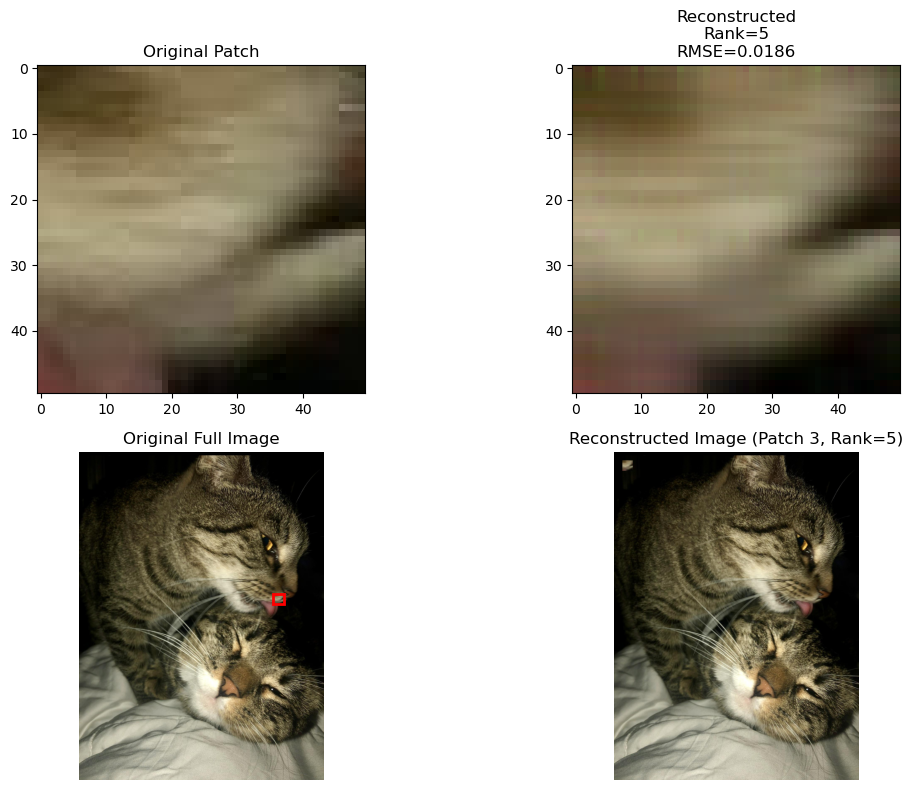


   Running Factorization with Rank = 10   
Channel 0, Iter 0, Loss: 157.97134399414062
Channel 0, Iter 200, Loss: 2.943607807159424
Channel 0, Iter 400, Loss: 1.5187643766403198
Channel 0, Iter 600, Loss: 1.0394283533096313
Channel 0, Iter 800, Loss: 0.8870745301246643
Channel 0, Iter 1000, Loss: 0.8341395854949951
Channel 0, Iter 1200, Loss: 0.7993226051330566
Channel 0, Iter 1400, Loss: 0.767508864402771
Channel 0, Iter 1600, Loss: 0.7390284538269043
Channel 0, Iter 1800, Loss: 0.7198172211647034
Channel 1, Iter 0, Loss: 147.7055206298828
Channel 1, Iter 200, Loss: 2.9254698753356934
Channel 1, Iter 400, Loss: 1.7986993789672852
Channel 1, Iter 600, Loss: 1.1173901557922363
Channel 1, Iter 800, Loss: 0.9671525359153748
Channel 1, Iter 1000, Loss: 0.9111413359642029
Channel 1, Iter 1200, Loss: 0.8459593653678894
Channel 1, Iter 1400, Loss: 0.7861602306365967
Channel 1, Iter 1600, Loss: 0.7405701279640198
Channel 1, Iter 1800, Loss: 0.6955104470252991
Channel 2, Iter 0, Loss: 157.2563

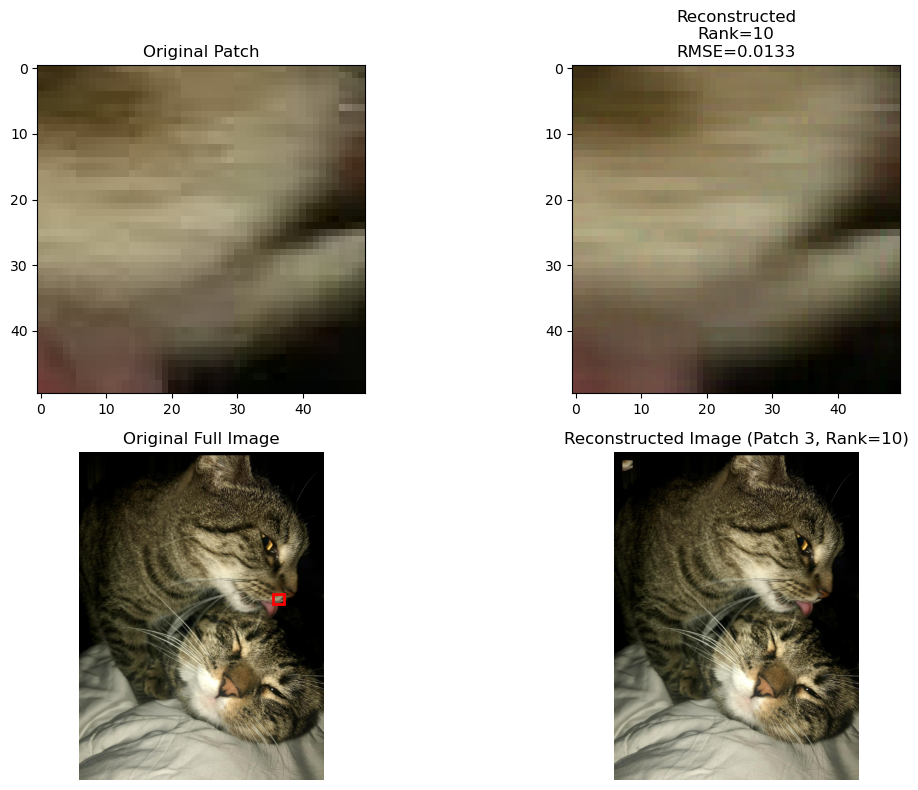


   Running Factorization with Rank = 25   
Channel 0, Iter 0, Loss: 246.25161743164062
Channel 0, Iter 200, Loss: 1.283341884613037
Channel 0, Iter 400, Loss: 0.6389164328575134
Channel 0, Iter 600, Loss: 0.5696794390678406
Channel 0, Iter 800, Loss: 0.5434701442718506
Channel 0, Iter 1000, Loss: 0.5224807262420654
Channel 0, Iter 1200, Loss: 0.5044030547142029
Channel 0, Iter 1400, Loss: 0.4850670099258423
Channel 0, Iter 1600, Loss: 0.4741055965423584
Channel 0, Iter 1800, Loss: 0.46194037795066833
Channel 1, Iter 0, Loss: 252.80426025390625
Channel 1, Iter 200, Loss: 1.169094443321228
Channel 1, Iter 400, Loss: 0.7601910829544067
Channel 1, Iter 600, Loss: 0.6452811360359192
Channel 1, Iter 800, Loss: 0.5653102993965149
Channel 1, Iter 1000, Loss: 0.5319935083389282
Channel 1, Iter 1200, Loss: 0.5101490020751953
Channel 1, Iter 1400, Loss: 0.5012403130531311
Channel 1, Iter 1600, Loss: 0.4895302951335907
Channel 1, Iter 1800, Loss: 0.4833020865917206
Channel 2, Iter 0, Loss: 247.12

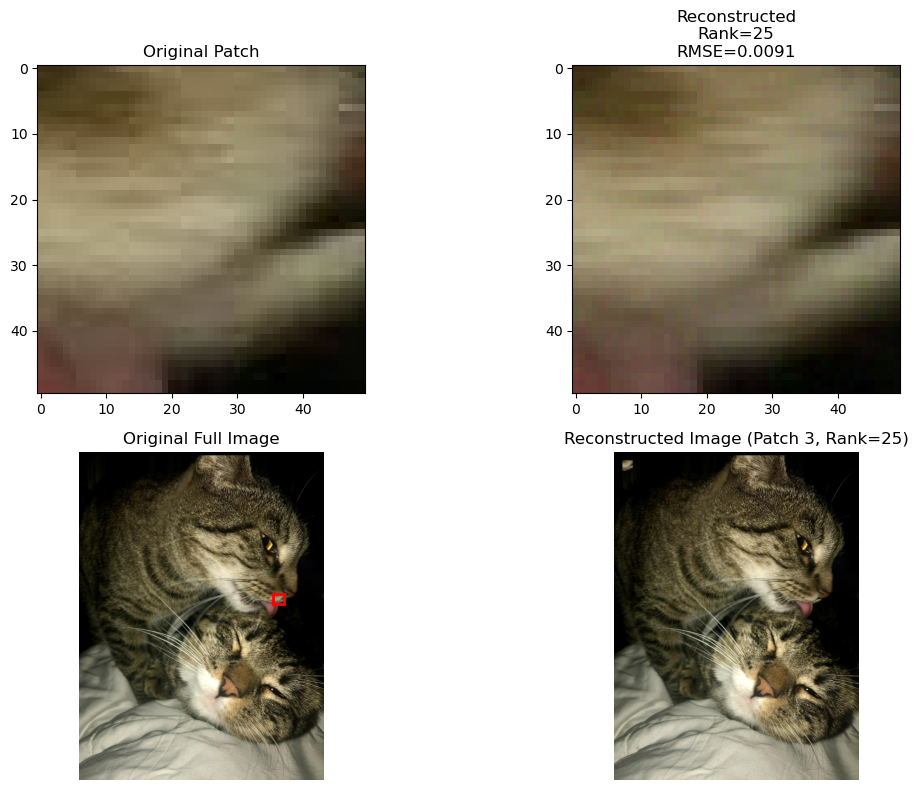


   Running Factorization with Rank = 50   
Channel 0, Iter 0, Loss: 350.30419921875
Channel 0, Iter 200, Loss: 0.6477785110473633
Channel 0, Iter 400, Loss: 0.5432829856872559
Channel 0, Iter 600, Loss: 0.4895036816596985
Channel 0, Iter 800, Loss: 0.46501103043556213
Channel 0, Iter 1000, Loss: 0.4386446177959442
Channel 0, Iter 1200, Loss: 0.4282877743244171
Channel 0, Iter 1400, Loss: 0.41774189472198486
Channel 0, Iter 1600, Loss: 0.4053860306739807
Channel 0, Iter 1800, Loss: 0.3965294659137726
Channel 1, Iter 0, Loss: 348.7792663574219
Channel 1, Iter 200, Loss: 0.6949788331985474
Channel 1, Iter 400, Loss: 0.5500478744506836
Channel 1, Iter 600, Loss: 0.4915330708026886
Channel 1, Iter 800, Loss: 0.4649600088596344
Channel 1, Iter 1000, Loss: 0.44658222794532776
Channel 1, Iter 1200, Loss: 0.4283618927001953
Channel 1, Iter 1400, Loss: 0.4220700263977051
Channel 1, Iter 1600, Loss: 0.4116487503051758
Channel 1, Iter 1800, Loss: 0.40397119522094727
Channel 2, Iter 0, Loss: 351.7

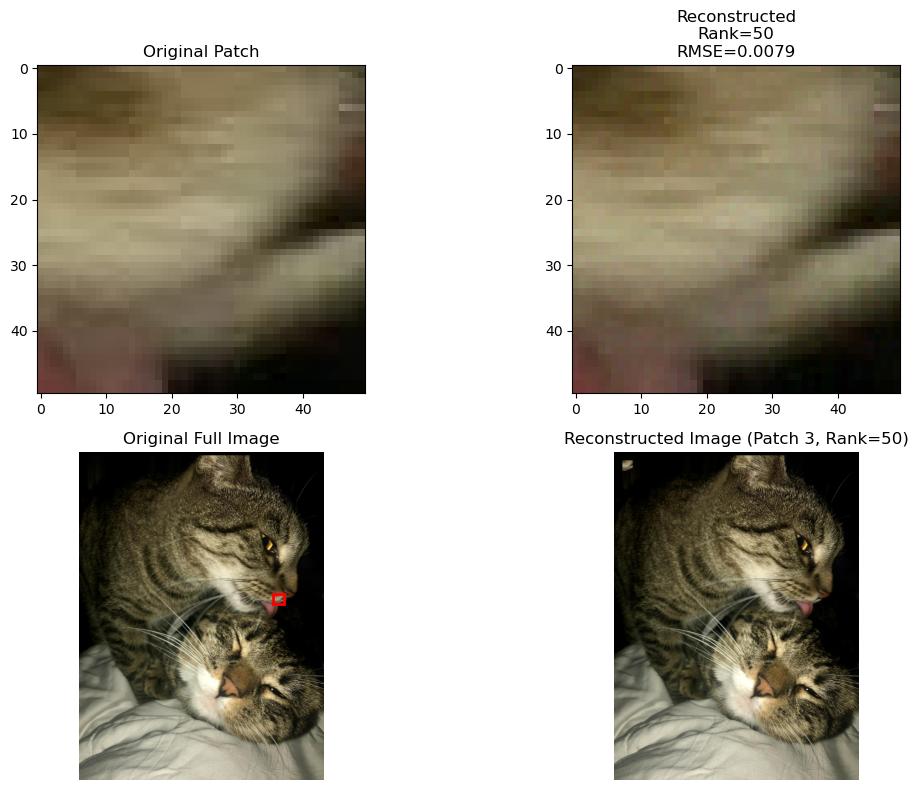

In [82]:
#for differerent ranks
r=[5,10,25,50]

#store the results
results_patch_3=[]

for rank in r:
    print(f"\n   Running Factorization with Rank = {rank}   ")

    #Factorization
    recon_patch_3, Ws_patch_3, Hs_patch_3, losses_patch_3, masks_patch_3 = stock_factorization_multichannel(patch_4_5_color, rank)

    #Clamp the values to 1, due to the same reason mentioned before
    recon_patch_3 = torch.clamp(recon_patch_3, 0.0, 1.0)
        
    #Compute the metrics
    rmse_patch_3, psnr_patch_3 = compute_rmse_psnr(patch_4_5_color, recon_patch_3)

    #store the results and print the metrics
    results_patch_3.append((rank, rmse_patch_3, psnr_patch_3))

    print(f"Patch 3 , r={rank} -> RMSE: {rmse_patch_3:.4f}, PSNR: {psnr_patch_3:.2f} dB")

    #Visualization
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_4_5_color.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_3.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed\nRank={rank}\nRMSE={rmse_patch_3:.4f}")

    top_3, left_3 = 680, 930

    patch_size_3 = patch_4_5_color.shape[1]  

    #clone the og image
    img_reconstructed_full_3 = B.clone()

    #replace the og_patch with the reconstructed patch
    img_reconstructed_full_3[:, top:top+patch_size_3, left:left+patch_size_3] = recon_patch_3

    # add red rectangle around patch
    rect = plt.Rectangle(
        (left_3, top_3), patch_size_3, patch_size_3,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect)

    axs[1][0].imshow(B.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_3.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 3, Rank={rank})")
    axs[1][1].axis("off")

    plt.tight_layout()
    plt.show()


In [83]:
data_patch_3= pd.DataFrame(columns=["Rank","RMSE_patch_3","PSNR_patch_3"])
for i in range(len(r)):
    data_patch_3.loc[len(data_patch_3)]=[r[i],results_patch_3[i][1],results_patch_3[i][2]]

In [84]:
data_patch_3

,Rank,RMSE_patch_3,PSNR_patch_3
0,5.0,0.018610,34.604857
1,10.0,0.013283,37.534149
2,25.0,0.009094,40.825090
3,50.0,0.007920,42.025862


Observation: We can see that as the rank of the matrices increases, we can see a more apt reproduction of the original patch, if

Trying out with other images

In [85]:
C,C_rect, C_rand = prepare_image_masks_torchvision("D:\ML_course\dog.jpg", missing_size=30, device=device)

<>:1: SyntaxWarning: invalid escape sequence '\M'
<>:1: SyntaxWarning: invalid escape sequence '\M'
C:\Users\Asus\AppData\Local\Temp\ipykernel_40748\1090726636.py:1: SyntaxWarning: invalid escape sequence '\M'
  C,C_rect, C_rand = prepare_image_masks_torchvision("D:\ML_course\dog.jpg", missing_size=30, device=device)


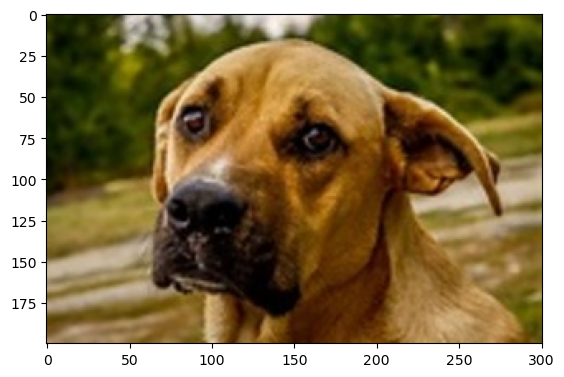

In [86]:
#Lets select the image patches
plt.imshow(C.permute(1,2,0).cpu())

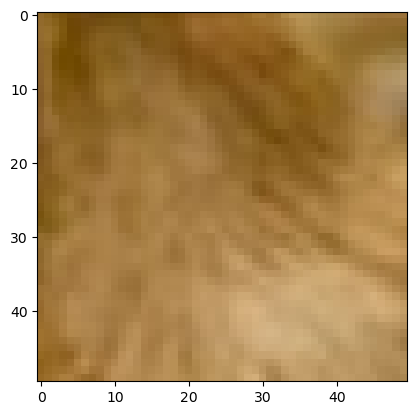

In [87]:
#one one-two colors
dc_crop_size=50
patch_one_color_dog = C[:, 146:146+crop_size, 210:210+crop_size]
plt.imshow(patch_one_color_dog.permute(1,2,0).cpu())


  Running Factorization with Rank = 5  
Channel 0, Iter 0, Loss: 110.30266571044922
Channel 0, Iter 200, Loss: 5.43467903137207
Channel 0, Iter 400, Loss: 1.8930444717407227
Channel 0, Iter 600, Loss: 1.4697457551956177
Channel 0, Iter 800, Loss: 1.4445710182189941
Channel 0, Iter 1000, Loss: 1.4095171689987183
Channel 0, Iter 1200, Loss: 1.3715978860855103
Channel 0, Iter 1400, Loss: 1.3214895725250244
Channel 0, Iter 1600, Loss: 1.2781484127044678
Channel 0, Iter 1800, Loss: 1.237825870513916
Channel 1, Iter 0, Loss: 110.51472473144531
Channel 1, Iter 200, Loss: 2.6926355361938477
Channel 1, Iter 400, Loss: 1.9102731943130493
Channel 1, Iter 600, Loss: 1.595842719078064
Channel 1, Iter 800, Loss: 1.5068552494049072
Channel 1, Iter 1000, Loss: 1.4301214218139648
Channel 1, Iter 1200, Loss: 1.3541648387908936
Channel 1, Iter 1400, Loss: 1.2878093719482422
Channel 1, Iter 1600, Loss: 1.238040566444397
Channel 1, Iter 1800, Loss: 1.2010680437088013
Channel 2, Iter 0, Loss: 110.420730590

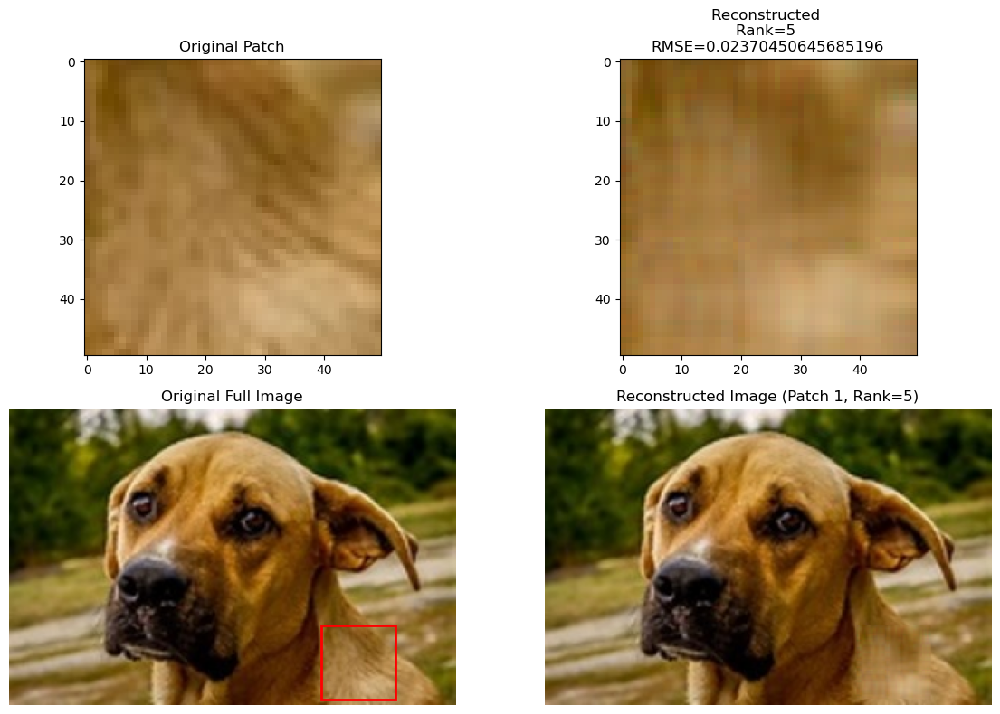


  Running Factorization with Rank = 10  
Channel 0, Iter 0, Loss: 164.0970916748047
Channel 0, Iter 200, Loss: 1.862492322921753
Channel 0, Iter 400, Loss: 1.3514807224273682
Channel 0, Iter 600, Loss: 1.2705954313278198
Channel 0, Iter 800, Loss: 1.186150312423706
Channel 0, Iter 1000, Loss: 1.1205412149429321
Channel 0, Iter 1200, Loss: 1.0570216178894043
Channel 0, Iter 1400, Loss: 1.0046836137771606
Channel 0, Iter 1600, Loss: 0.9650993347167969
Channel 0, Iter 1800, Loss: 0.9230982661247253
Channel 1, Iter 0, Loss: 147.30409240722656
Channel 1, Iter 200, Loss: 2.0329599380493164
Channel 1, Iter 400, Loss: 1.2522900104522705
Channel 1, Iter 600, Loss: 1.182891845703125
Channel 1, Iter 800, Loss: 1.1479246616363525
Channel 1, Iter 1000, Loss: 1.1131651401519775
Channel 1, Iter 1200, Loss: 1.0699001550674438
Channel 1, Iter 1400, Loss: 1.0249806642532349
Channel 1, Iter 1600, Loss: 0.9840043783187866
Channel 1, Iter 1800, Loss: 0.9473361968994141
Channel 2, Iter 0, Loss: 165.3439788

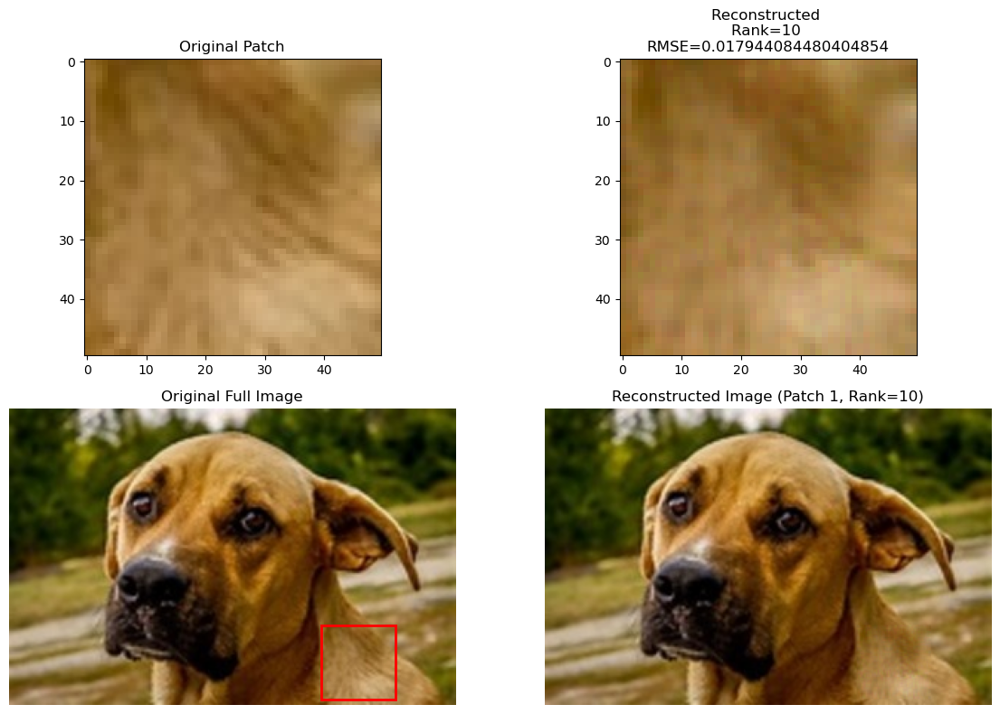


  Running Factorization with Rank = 25  
Channel 0, Iter 0, Loss: 250.91981506347656
Channel 0, Iter 200, Loss: 1.1649454832077026
Channel 0, Iter 400, Loss: 0.9352260231971741
Channel 0, Iter 600, Loss: 0.7941734194755554
Channel 0, Iter 800, Loss: 0.747613787651062
Channel 0, Iter 1000, Loss: 0.7039978504180908
Channel 0, Iter 1200, Loss: 0.6651160717010498
Channel 0, Iter 1400, Loss: 0.6303452253341675
Channel 0, Iter 1600, Loss: 0.5838481187820435
Channel 0, Iter 1800, Loss: 0.5611434578895569
Channel 1, Iter 0, Loss: 252.48202514648438
Channel 1, Iter 200, Loss: 1.2986871004104614
Channel 1, Iter 400, Loss: 0.9178255796432495
Channel 1, Iter 600, Loss: 0.8120117783546448
Channel 1, Iter 800, Loss: 0.7374743223190308
Channel 1, Iter 1000, Loss: 0.688319206237793
Channel 1, Iter 1200, Loss: 0.6511868238449097
Channel 1, Iter 1400, Loss: 0.6236148476600647
Channel 1, Iter 1600, Loss: 0.6033514738082886
Channel 1, Iter 1800, Loss: 0.5736388564109802
Channel 2, Iter 0, Loss: 252.64425

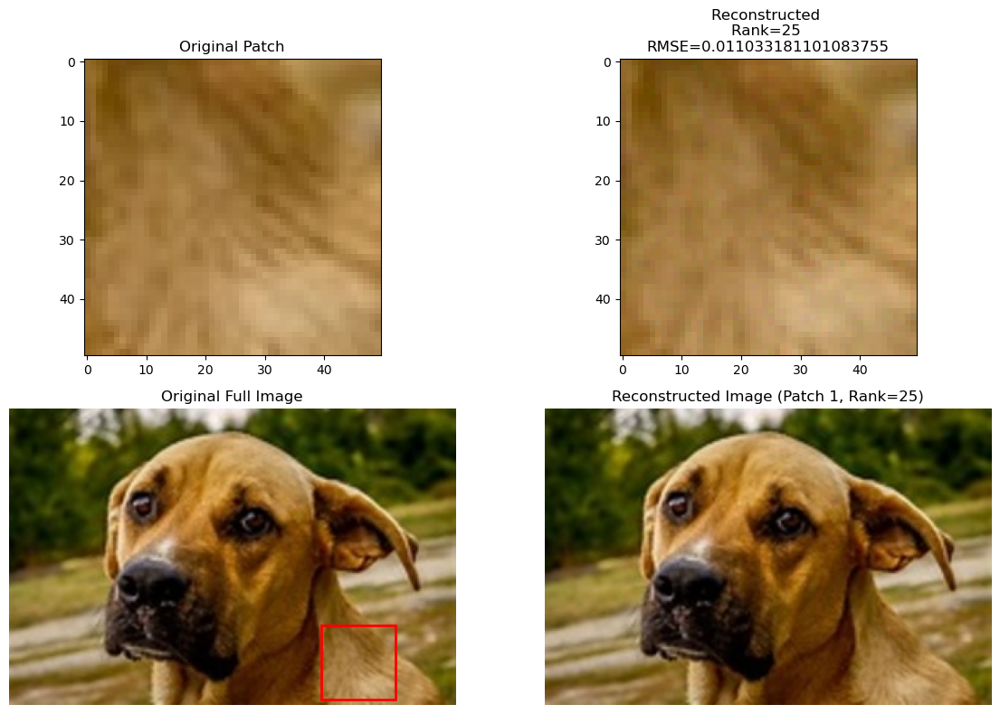


  Running Factorization with Rank = 50  
Channel 0, Iter 0, Loss: 352.0963439941406
Channel 0, Iter 200, Loss: 0.7384293675422668
Channel 0, Iter 400, Loss: 0.5828956365585327
Channel 0, Iter 600, Loss: 0.5386733412742615
Channel 0, Iter 800, Loss: 0.506596028804779
Channel 0, Iter 1000, Loss: 0.48094427585601807
Channel 0, Iter 1200, Loss: 0.46306630969047546
Channel 0, Iter 1400, Loss: 0.45093539357185364
Channel 0, Iter 1600, Loss: 0.4333711266517639
Channel 0, Iter 1800, Loss: 0.42443224787712097
Channel 1, Iter 0, Loss: 365.3116149902344
Channel 1, Iter 200, Loss: 0.7872798442840576
Channel 1, Iter 400, Loss: 0.6433597803115845
Channel 1, Iter 600, Loss: 0.5760002136230469
Channel 1, Iter 800, Loss: 0.5436366200447083
Channel 1, Iter 1000, Loss: 0.5184675455093384
Channel 1, Iter 1200, Loss: 0.49526312947273254
Channel 1, Iter 1400, Loss: 0.4791543781757355
Channel 1, Iter 1600, Loss: 0.4621634781360626
Channel 1, Iter 1800, Loss: 0.44336459040641785
Channel 2, Iter 0, Loss: 340.

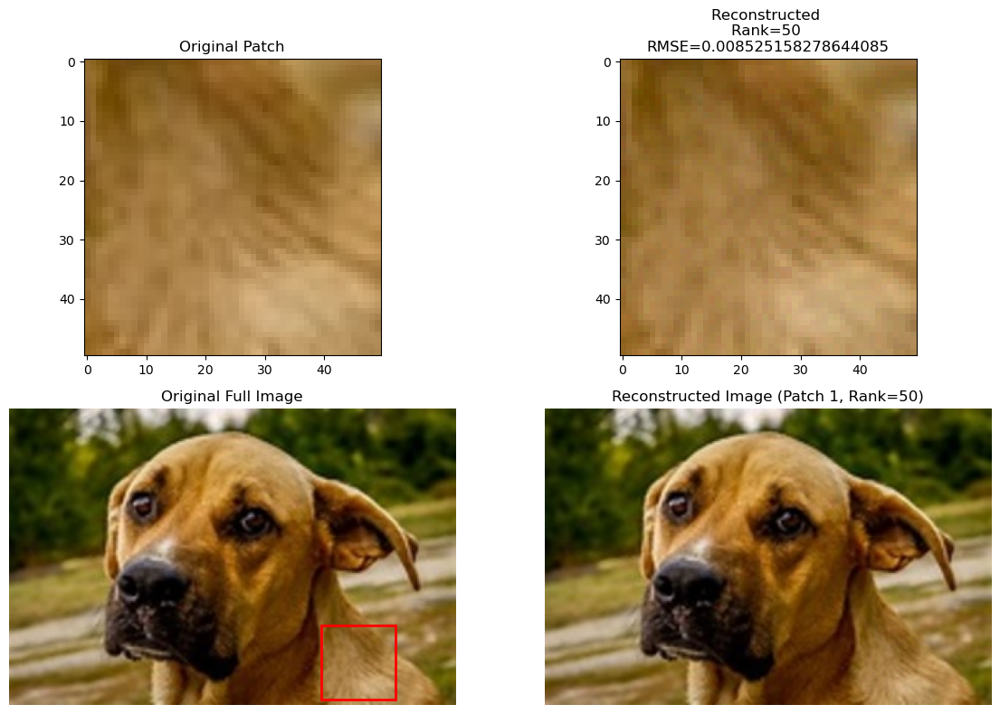

In [88]:
#for different ranks
r=[5,10,25,50]

#storing them
results_patch_1_dog=[]

for rank in r:
    print(f"\n  Running Factorization with Rank = {rank}  ")

    #Stock Factorization
    recon_patch_1_dog, Ws_patch_1_dog, Hs_patch_1_dog, losses_patch_1_dog, masks_patch_1_dog = stock_factorization_multichannel(patch_one_color_dog, rank)

    #clamp reconstructed vals to 1
    recon_patch_1_dog=torch.clamp(recon_patch_1_dog, 0.0, 1.0)
        
    #compute metrics prescribed before
    rmse_patch_1_dog, psnr_patch_1_dog=compute_rmse_psnr(patch_one_color_dog, recon_patch_1_dog)

    #store results
    results_patch_1_dog.append((rank, rmse_patch_1_dog, psnr_patch_1_dog))

    print(f"Patch 1 , r={rank} -> RMSE: {rmse_patch_1_dog:.4f}, PSNR: {psnr_patch_1_dog:.2f} dB")

    #visualizing them
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_one_color_dog.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_1_dog.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed \nRank={rank} \nRMSE={rmse_patch_1_dog}")

    top_2_dog, left_2_dog = 146,210   #from rhe previous cell

    patch_size_dog = patch_one_color_dog.shape[1]  

    #clone the image and then replace the og patch with the reconstructed patch
    img_reconstructed_full_1_dog=C.clone()

    # Replace the patch region with the reconstructed one
    img_reconstructed_full_1_dog[:, top_2_dog:top_2_dog+patch_size_dog, left_2_dog:left_2_dog+patch_size_dog] = recon_patch_1_dog

    rect_dog_1 = plt.Rectangle(
        (left_2_dog, top_2_dog), patch_size_dog, patch_size_dog,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect_dog_1)


    axs[1][0].imshow(C.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_1_dog.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 1, Rank={rank})")
    axs[1][1].axis("off")

    plt.tight_layout()
    plt.show()



In [89]:
#summarizing as a table
data_patch_1_dog= pd.DataFrame(columns=["Rank","RMSE_patch_1_dog","PSNR_patch_1_dog"])
for i in range(len(r)):
    data_patch_1_dog.loc[len(data_patch_1_dog)]=[r[i],results_patch_1_dog[i][1],results_patch_1_dog[i][2]]
data_patch_1_dog

,Rank,RMSE_patch_1_dog,PSNR_patch_1_dog
0,5.0,0.023705,32.503381
1,10.0,0.017944,34.921575
2,25.0,0.011033,39.145985
3,50.0,0.008525,41.385951


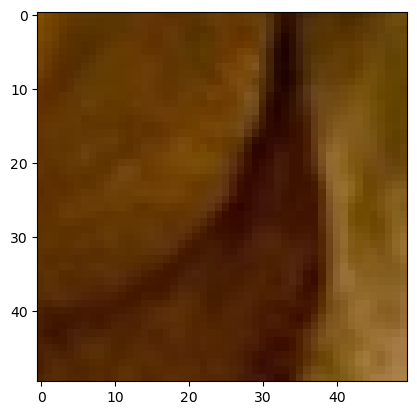

In [90]:
#Two-three colors
patch_tw_th_color_dog = C[:, 125:125+crop_size, 170:170+crop_size]
plt.imshow(patch_tw_th_color_dog.permute(1,2,0).cpu())


  Running Factorization with Rank = 5 
Channel 0, Iter 0, Loss: 109.16471862792969
Channel 0, Iter 200, Loss: 3.0566394329071045
Channel 0, Iter 400, Loss: 1.8887298107147217
Channel 0, Iter 600, Loss: 1.657467246055603
Channel 0, Iter 800, Loss: 1.4406567811965942
Channel 0, Iter 1000, Loss: 1.2347983121871948
Channel 0, Iter 1200, Loss: 1.1024285554885864
Channel 0, Iter 1400, Loss: 1.0302815437316895
Channel 0, Iter 1600, Loss: 0.9783223867416382
Channel 0, Iter 1800, Loss: 0.9300797581672668
Channel 1, Iter 0, Loss: 111.58868408203125
Channel 1, Iter 200, Loss: 2.631615161895752
Channel 1, Iter 400, Loss: 2.072716474533081
Channel 1, Iter 600, Loss: 1.554319143295288
Channel 1, Iter 800, Loss: 1.3482788801193237
Channel 1, Iter 1000, Loss: 1.236796498298645
Channel 1, Iter 1200, Loss: 1.1326112747192383
Channel 1, Iter 1400, Loss: 1.0424151420593262
Channel 1, Iter 1600, Loss: 0.9719358682632446
Channel 1, Iter 1800, Loss: 0.9235340356826782
Channel 2, Iter 0, Loss: 114.5080642700

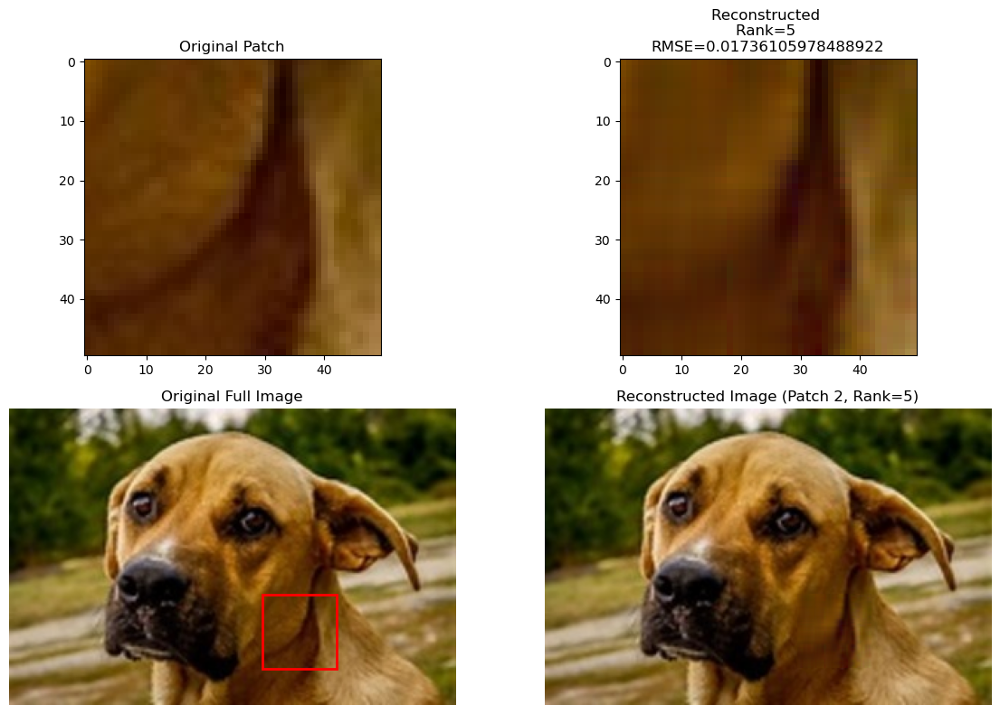


  Running Factorization with Rank = 10 
Channel 0, Iter 0, Loss: 151.61480712890625
Channel 0, Iter 200, Loss: 2.332308292388916
Channel 0, Iter 400, Loss: 1.458311676979065
Channel 0, Iter 600, Loss: 1.1588588953018188
Channel 0, Iter 800, Loss: 0.9599010944366455
Channel 0, Iter 1000, Loss: 0.8583835363388062
Channel 0, Iter 1200, Loss: 0.8160071969032288
Channel 0, Iter 1400, Loss: 0.7882782220840454
Channel 0, Iter 1600, Loss: 0.7721664309501648
Channel 0, Iter 1800, Loss: 0.7552737593650818
Channel 1, Iter 0, Loss: 147.54351806640625
Channel 1, Iter 200, Loss: 2.404413938522339
Channel 1, Iter 400, Loss: 1.468301773071289
Channel 1, Iter 600, Loss: 1.120477557182312
Channel 1, Iter 800, Loss: 0.9637957811355591
Channel 1, Iter 1000, Loss: 0.8774901032447815
Channel 1, Iter 1200, Loss: 0.8198811411857605
Channel 1, Iter 1400, Loss: 0.7662973999977112
Channel 1, Iter 1600, Loss: 0.7246102690696716
Channel 1, Iter 1800, Loss: 0.6941697597503662
Channel 2, Iter 0, Loss: 146.881515502

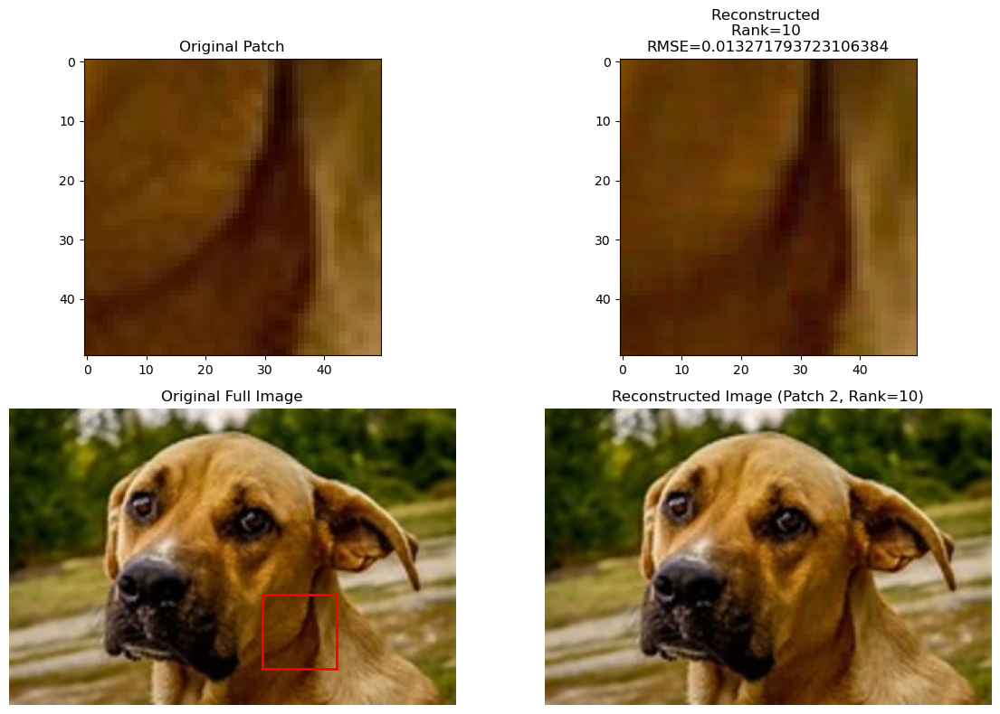


  Running Factorization with Rank = 25 
Channel 0, Iter 0, Loss: 258.91082763671875
Channel 0, Iter 200, Loss: 1.5766263008117676
Channel 0, Iter 400, Loss: 0.7027848362922668
Channel 0, Iter 600, Loss: 0.6086783409118652
Channel 0, Iter 800, Loss: 0.5349972248077393
Channel 0, Iter 1000, Loss: 0.5087307095527649
Channel 0, Iter 1200, Loss: 0.4872039258480072
Channel 0, Iter 1400, Loss: 0.46776849031448364
Channel 0, Iter 1600, Loss: 0.4539945423603058
Channel 0, Iter 1800, Loss: 0.43946632742881775
Channel 1, Iter 0, Loss: 261.7327575683594
Channel 1, Iter 200, Loss: 1.309633731842041
Channel 1, Iter 400, Loss: 0.7005522847175598
Channel 1, Iter 600, Loss: 0.6228223443031311
Channel 1, Iter 800, Loss: 0.5905419588088989
Channel 1, Iter 1000, Loss: 0.5778291821479797
Channel 1, Iter 1200, Loss: 0.5444093942642212
Channel 1, Iter 1400, Loss: 0.5184308290481567
Channel 1, Iter 1600, Loss: 0.49976876378059387
Channel 1, Iter 1800, Loss: 0.4776934087276459
Channel 2, Iter 0, Loss: 250.003

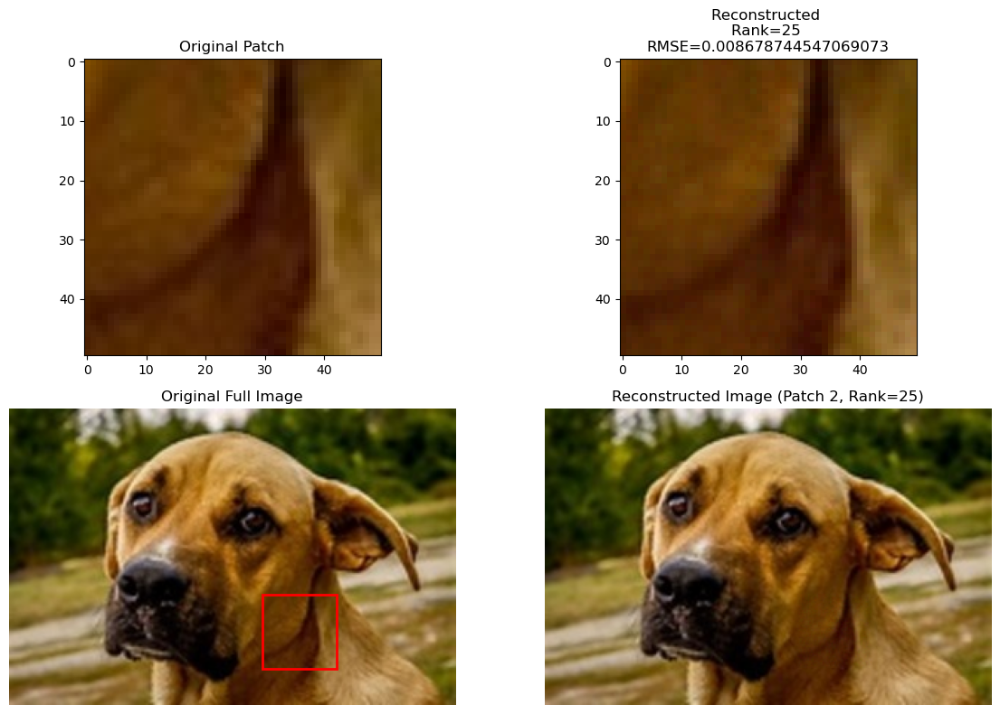


  Running Factorization with Rank = 50 
Channel 0, Iter 0, Loss: 355.5957336425781
Channel 0, Iter 200, Loss: 0.7665764689445496
Channel 0, Iter 400, Loss: 0.5751684904098511
Channel 0, Iter 600, Loss: 0.531373918056488
Channel 0, Iter 800, Loss: 0.5053148865699768
Channel 0, Iter 1000, Loss: 0.47972559928894043
Channel 0, Iter 1200, Loss: 0.46258750557899475
Channel 0, Iter 1400, Loss: 0.44734498858451843
Channel 0, Iter 1600, Loss: 0.4360012710094452
Channel 0, Iter 1800, Loss: 0.4250275790691376
Channel 1, Iter 0, Loss: 362.9311828613281
Channel 1, Iter 200, Loss: 0.8563119173049927
Channel 1, Iter 400, Loss: 0.5502362847328186
Channel 1, Iter 600, Loss: 0.5037766695022583
Channel 1, Iter 800, Loss: 0.47025254368782043
Channel 1, Iter 1000, Loss: 0.4563985764980316
Channel 1, Iter 1200, Loss: 0.43650022149086
Channel 1, Iter 1400, Loss: 0.42406702041625977
Channel 1, Iter 1600, Loss: 0.41243764758110046
Channel 1, Iter 1800, Loss: 0.40196970105171204
Channel 2, Iter 0, Loss: 364.28

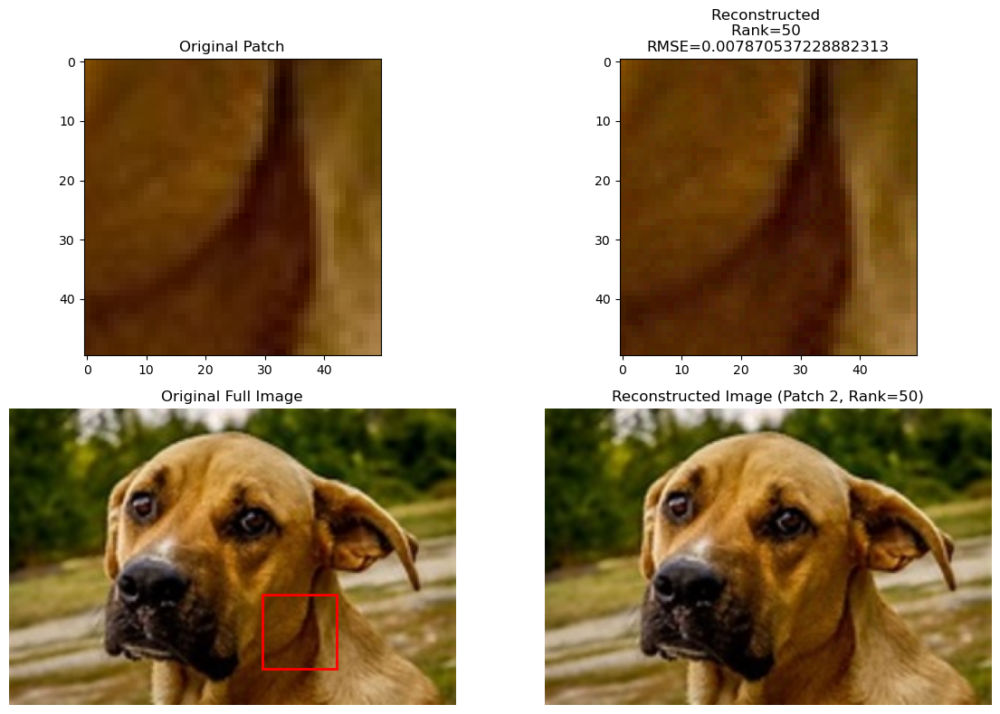

In [91]:
#for different ranks
r=[5,10,25,50]

#storing them
results_patch_2_dog=[]

for rank in r:
    print(f"\n  Running Factorization with Rank = {rank} ")

    #Stock Factorization
    recon_patch_2_dog, Ws_patch_2_dog, Hs_patch_2_dog, losses_patch_2_dog, masks_patch_2_dog = stock_factorization_multichannel(patch_tw_th_color_dog, rank)

    #clamp reconstructed vals to 1
    recon_patch_2_dog=torch.clamp(recon_patch_2_dog, 0.0, 1.0)
        
    #compute metrics prescribed before
    rmse_patch_2_dog, psnr_patch_2_dog=compute_rmse_psnr(patch_tw_th_color_dog, recon_patch_2_dog)

    #store results
    results_patch_2_dog.append((rank, rmse_patch_2_dog, psnr_patch_2_dog))

    print(f"Patch 2 , r={rank} -> RMSE: {rmse_patch_2_dog:.4f}, PSNR: {psnr_patch_2_dog:.2f} dB")

    #visualizing them
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_tw_th_color_dog.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_2_dog.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed \nRank={rank} \nRMSE={rmse_patch_2_dog}")

    top_2_dog, left_2_dog = 125,170   #from rhe previous cell

    patch_size_dog_2 = patch_tw_th_color_dog.shape[1]  

    #clone the image and then replace the og patch with the reconstructed patch
    img_reconstructed_full_2_dog=C.clone()

    # Replace the patch region with the reconstructed one
    img_reconstructed_full_2_dog[:, top_2_dog:top_2_dog+patch_size_dog_2, left_2_dog:left_2_dog+patch_size_dog_2] = recon_patch_2_dog

    rect_dog_2 = plt.Rectangle(
        (left_2_dog, top_2_dog), patch_size_dog_2, patch_size_dog_2,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect_dog_2)

    axs[1][0].imshow(C.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_2_dog.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 2, Rank={rank})")
    axs[1][1].axis("off")

    plt.tight_layout()
    plt.show()



In [92]:
#summarizing as a table
data_patch_2_dog= pd.DataFrame(columns=["Rank","RMSE_patch_2_dog","PSNR_patch_2_dog"])
for i in range(len(r)):
    data_patch_2_dog.loc[len(data_patch_2_dog)]=[r[i],results_patch_2_dog[i][1],results_patch_2_dog[i][2]]
data_patch_2_dog

,Rank,RMSE_patch_2_dog,PSNR_patch_2_dog
0,5.0,0.017361,35.208476
1,10.0,0.013272,37.541406
2,25.0,0.008679,41.230860
3,50.0,0.007871,42.079911


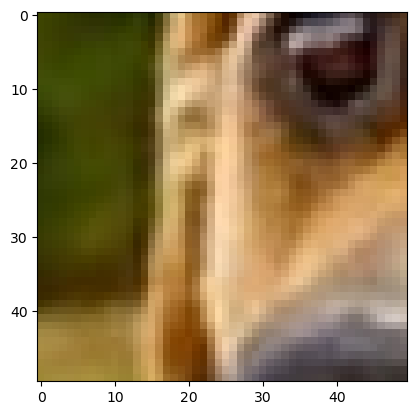

In [93]:
#4-5 colors
patch_4_5_color_dog = C[:, 60:60+crop_size, 50:50+crop_size]
plt.imshow(patch_4_5_color_dog.permute(1,2,0).cpu())


  Running Factorization with Rank = 5  
Channel 0, Iter 0, Loss: 123.0661849975586
Channel 0, Iter 200, Loss: 8.98873519897461
Channel 0, Iter 400, Loss: 4.970123291015625
Channel 0, Iter 600, Loss: 3.7692008018493652
Channel 0, Iter 800, Loss: 3.3198530673980713
Channel 0, Iter 1000, Loss: 3.0283238887786865
Channel 0, Iter 1200, Loss: 2.7337653636932373
Channel 0, Iter 1400, Loss: 2.49206805229187
Channel 0, Iter 1600, Loss: 2.339113235473633
Channel 0, Iter 1800, Loss: 2.2533469200134277
Channel 1, Iter 0, Loss: 103.68278503417969
Channel 1, Iter 200, Loss: 5.887295722961426
Channel 1, Iter 400, Loss: 3.229691743850708
Channel 1, Iter 600, Loss: 3.0290727615356445
Channel 1, Iter 800, Loss: 2.820004463195801
Channel 1, Iter 1000, Loss: 2.513601064682007
Channel 1, Iter 1200, Loss: 2.246432065963745
Channel 1, Iter 1400, Loss: 2.154357433319092
Channel 1, Iter 1600, Loss: 2.1356964111328125
Channel 1, Iter 1800, Loss: 2.1314737796783447
Channel 2, Iter 0, Loss: 117.58766174316406
Ch

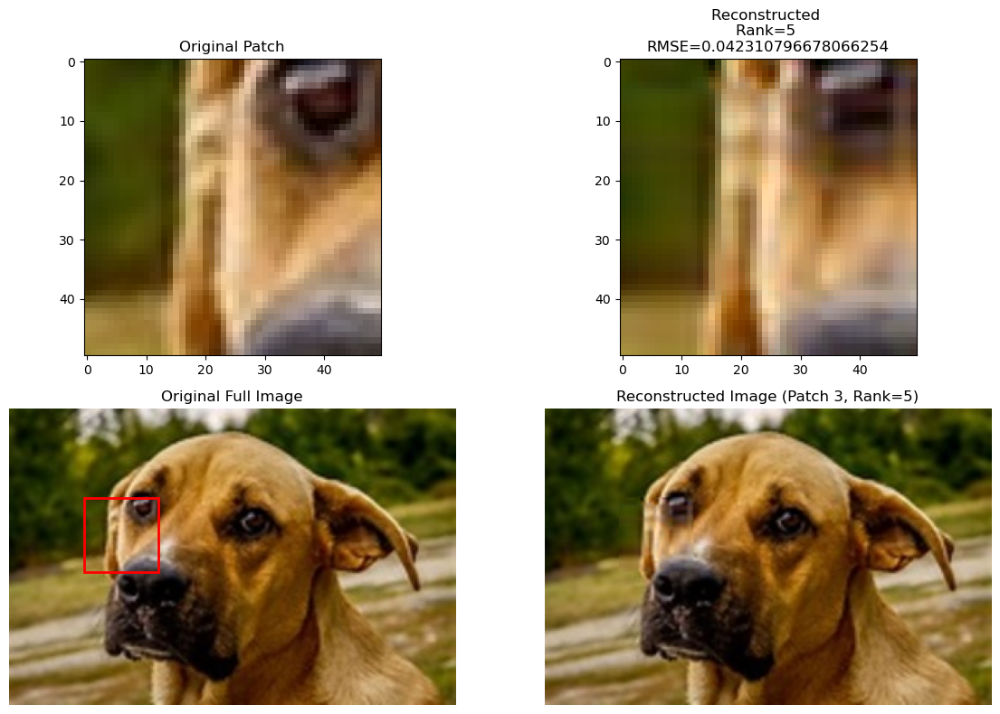


  Running Factorization with Rank = 10  
Channel 0, Iter 0, Loss: 153.92083740234375
Channel 0, Iter 200, Loss: 4.737951278686523
Channel 0, Iter 400, Loss: 2.6459996700286865
Channel 0, Iter 600, Loss: 1.997446060180664
Channel 0, Iter 800, Loss: 1.6104587316513062
Channel 0, Iter 1000, Loss: 1.4410247802734375
Channel 0, Iter 1200, Loss: 1.3188378810882568
Channel 0, Iter 1400, Loss: 1.2336419820785522
Channel 0, Iter 1600, Loss: 1.188181757926941
Channel 0, Iter 1800, Loss: 1.153520107269287
Channel 1, Iter 0, Loss: 167.29563903808594
Channel 1, Iter 200, Loss: 4.779716491699219
Channel 1, Iter 400, Loss: 3.2069828510284424
Channel 1, Iter 600, Loss: 2.239309787750244
Channel 1, Iter 800, Loss: 1.753049612045288
Channel 1, Iter 1000, Loss: 1.5987944602966309
Channel 1, Iter 1200, Loss: 1.4409637451171875
Channel 1, Iter 1400, Loss: 1.3060739040374756
Channel 1, Iter 1600, Loss: 1.2230045795440674
Channel 1, Iter 1800, Loss: 1.1710807085037231
Channel 2, Iter 0, Loss: 155.6944427490

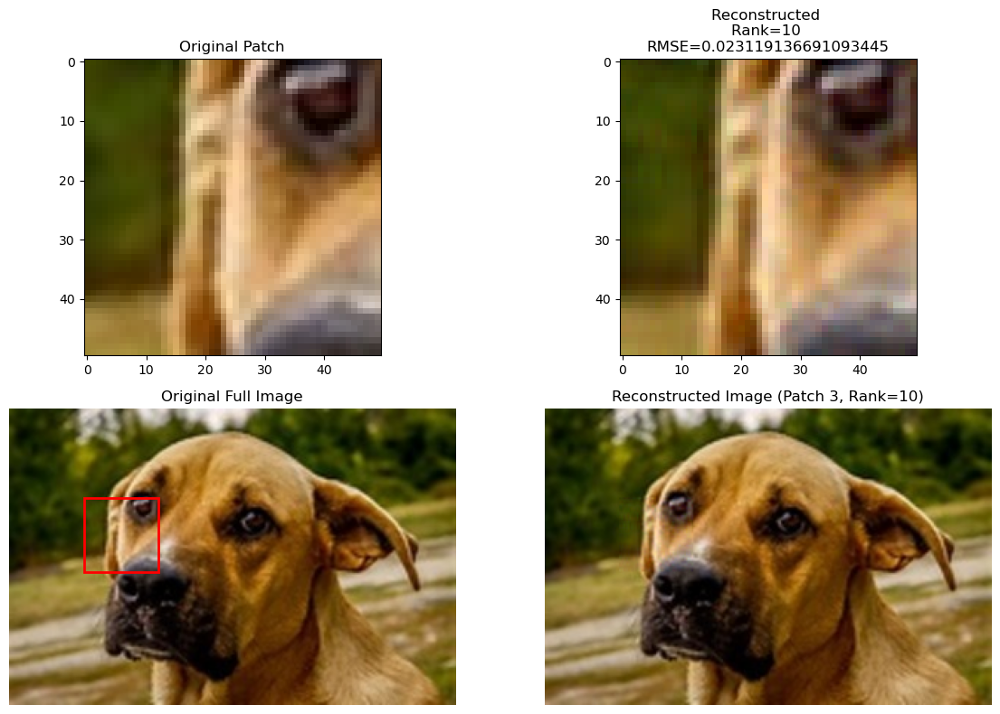


  Running Factorization with Rank = 25  
Channel 0, Iter 0, Loss: 250.7406463623047
Channel 0, Iter 200, Loss: 2.483363389968872
Channel 0, Iter 400, Loss: 1.522463083267212
Channel 0, Iter 600, Loss: 1.0284745693206787
Channel 0, Iter 800, Loss: 0.891930878162384
Channel 0, Iter 1000, Loss: 0.834037184715271
Channel 0, Iter 1200, Loss: 0.7402891516685486
Channel 0, Iter 1400, Loss: 0.6927804946899414
Channel 0, Iter 1600, Loss: 0.6507790684700012
Channel 0, Iter 1800, Loss: 0.6100960373878479
Channel 1, Iter 0, Loss: 259.4569396972656
Channel 1, Iter 200, Loss: 2.3193352222442627
Channel 1, Iter 400, Loss: 1.4137219190597534
Channel 1, Iter 600, Loss: 1.1502772569656372
Channel 1, Iter 800, Loss: 1.0010013580322266
Channel 1, Iter 1000, Loss: 0.8889143466949463
Channel 1, Iter 1200, Loss: 0.8011474013328552
Channel 1, Iter 1400, Loss: 0.7167618870735168
Channel 1, Iter 1600, Loss: 0.6667002439498901
Channel 1, Iter 1800, Loss: 0.6267433762550354
Channel 2, Iter 0, Loss: 246.308425903

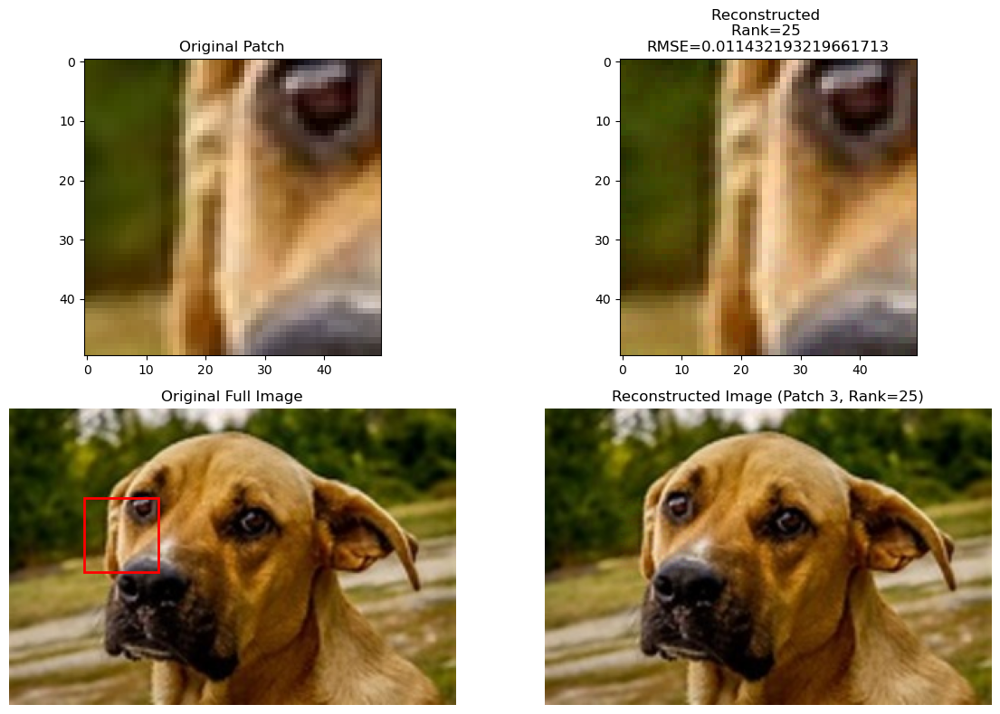


  Running Factorization with Rank = 50  
Channel 0, Iter 0, Loss: 360.6716613769531
Channel 0, Iter 200, Loss: 1.0172609090805054
Channel 0, Iter 400, Loss: 0.7099085450172424
Channel 0, Iter 600, Loss: 0.5975328683853149
Channel 0, Iter 800, Loss: 0.5538578033447266
Channel 0, Iter 1000, Loss: 0.515738308429718
Channel 0, Iter 1200, Loss: 0.48962944746017456
Channel 0, Iter 1400, Loss: 0.47224363684654236
Channel 0, Iter 1600, Loss: 0.4558151960372925
Channel 0, Iter 1800, Loss: 0.4416261613368988
Channel 1, Iter 0, Loss: 356.0255126953125
Channel 1, Iter 200, Loss: 1.006431221961975
Channel 1, Iter 400, Loss: 0.7706608772277832
Channel 1, Iter 600, Loss: 0.6503951549530029
Channel 1, Iter 800, Loss: 0.5987383127212524
Channel 1, Iter 1000, Loss: 0.5517175793647766
Channel 1, Iter 1200, Loss: 0.5166544914245605
Channel 1, Iter 1400, Loss: 0.48553377389907837
Channel 1, Iter 1600, Loss: 0.46619871258735657
Channel 1, Iter 1800, Loss: 0.4443109333515167
Channel 2, Iter 0, Loss: 355.812

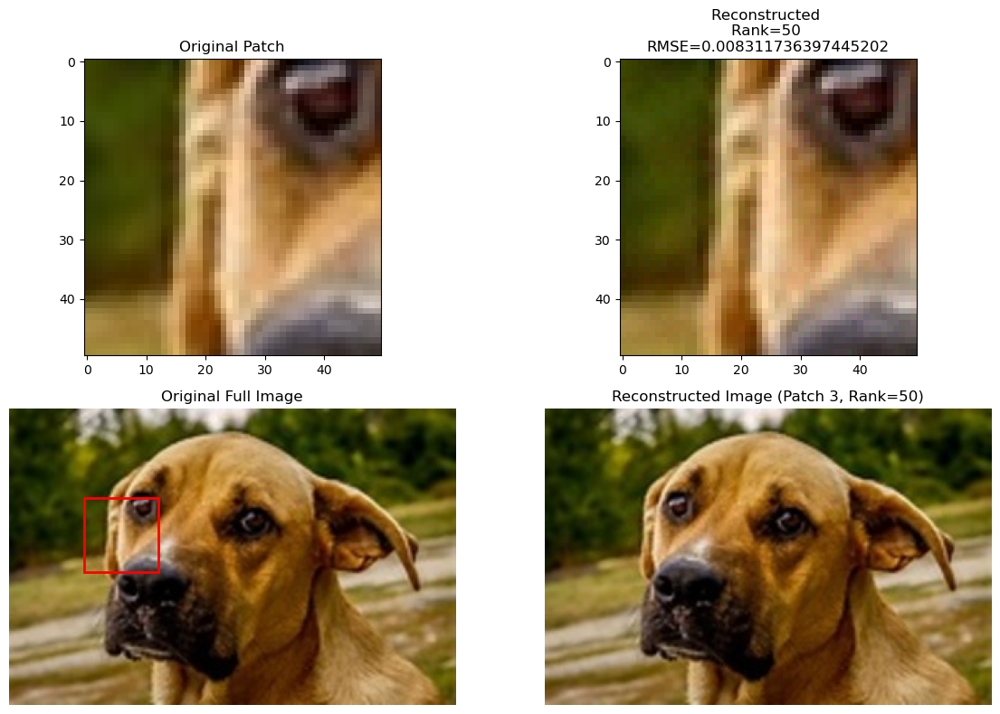

In [94]:
#for different ranks
r=[5,10,25,50]

#storing them
results_patch_3_dog=[]

for rank in r:
    print(f"\n  Running Factorization with Rank = {rank}  ")

    #Stock Factorization
    recon_patch_3_dog, Ws_patch_3_dog, Hs_patch_3_dog, losses_patch_3_dog, masks_patch_3_dog = stock_factorization_multichannel(patch_4_5_color_dog, rank)

    #clamp reconstructed vals to 1
    recon_patch_3_dog=torch.clamp(recon_patch_3_dog, 0.0, 1.0)
        
    #compute metrics prescribed before
    rmse_patch_3_dog, psnr_patch_3_dog=compute_rmse_psnr(patch_4_5_color_dog, recon_patch_3_dog)

    #store results
    results_patch_3_dog.append((rank, rmse_patch_3_dog, psnr_patch_3_dog))

    print(f"Patch 3 , r={rank} -> RMSE: {rmse_patch_3_dog:.4f}, PSNR: {psnr_patch_3_dog:.2f} dB")

    #visualizing them
    fig, axs = plt.subplots(2, 2, figsize=(12,8))

    axs[0][0].imshow(patch_4_5_color_dog.permute(1,2,0).cpu())
    axs[0][0].set_title("Original Patch")

    axs[0][1].imshow(recon_patch_3_dog.permute(1,2,0).cpu())
    axs[0][1].set_title(f"Reconstructed \nRank={rank} \nRMSE={rmse_patch_3_dog}")

    top_3_dog, left_3_dog = 60,50   #from rhe previous cell

    patch_size_dog_3 = patch_4_5_color_dog.shape[1]  

    #clone the image and then replace the og patch with the reconstructed patch
    img_reconstructed_full_3_dog=C.clone()

    # Replace the patch region with the reconstructed one
    img_reconstructed_full_3_dog[:, top_3_dog:top_3_dog+patch_size_dog_3, left_3_dog:left_3_dog+patch_size_dog_3] = recon_patch_3_dog

    rect_dog_3 = plt.Rectangle(
        (left_3_dog, top_3_dog), patch_size_dog_3, patch_size_dog_3,
        linewidth=2, edgecolor='r', facecolor='none'
    )
    axs[1][0].add_patch(rect_dog_3)


    axs[1][0].imshow(C.permute(1, 2, 0).cpu())
    axs[1][0].set_title("Original Full Image")
    axs[1][0].axis("off")

    axs[1][1].imshow(img_reconstructed_full_3_dog.permute(1, 2, 0).cpu())
    axs[1][1].set_title(f"Reconstructed Image (Patch 3, Rank={rank})")
    axs[1][1].axis("off")

    plt.tight_layout()
    plt.show()



In [95]:
#summarizing as a table
data_patch_3_dog= pd.DataFrame(columns=["Rank","RMSE_patch_3_dog","PSNR_patch_3_dog"])
for i in range(len(r)):
    data_patch_3_dog.loc[len(data_patch_3_dog)]=[r[i],results_patch_3_dog[i][1],results_patch_3_dog[i][2]]

In [96]:
data_patch_3_dog

,Rank,RMSE_patch_3_dog,PSNR_patch_3_dog
0,5.0,0.042311,27.470977
1,10.0,0.023119,32.720568
2,25.0,0.011432,38.837409
3,50.0,0.008312,41.606164


We can see that the RMSE decreases as Rank increases